In [1]:
# ==========================================================
# Part 1. Generate no_certainty.xlsx
#
# Added metrics:
#   MI
#   equal_width_bin_late_minus_early_buffer_width
#   equal_width_bin_late_minus_middle_buffer_width
#   equal_width_bin_buffer_width_segment_range
#   equal_width_bin_buffer_width_segment_cv
#   equal_width_bin_late_div_early_buffer_width
# ==========================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr, spearmanr, ks_2samp, wasserstein_distance
from scipy.spatial.distance import pdist, squareform
from statsmodels.nonparametric.smoothers_lowess import lowess


# ==========================================================
# 0. Basic settings
# ==========================================================

SEED = 88
N = 170

np.random.seed(SEED)
rng = np.random.default_rng(SEED)

x = np.linspace(0, 1, N)

properties = [
    ("Direction", "Positive direction", "Negative direction"),
    ("Monotonicity", "Monotonic", "Non-monotonic"),
    ("Strength", "Weak response", "Strong response"),
    ("Non-linearity", "Linear", "Non-linear"),
    ("Convexity / Concavity", "Convex", "Concave"),
    ("Saturation", "No saturation", "Saturation"),
    ("Turning point", "No turning point", "Turning point"),
    ("Threshold", "No threshold", "Threshold-like change"),
    ("Spread", "Low spread", "High spread"),
    ("Heteroscedasticity", "Constant spread", "Changing spread"),
    ("Density", "Even coverage", "Uneven coverage"),
    ("Clustering", "Single cloud", "Separated clusters"),
    ("Certainty", "High certainty", "Low certainty"),
]


# ==========================================================
# 1. Base curve / structure generation
# ==========================================================

def curve_data(prop, seed=SEED, n=N):
    local_rng = np.random.default_rng(seed)
    xx = np.linspace(0, 1, n)

    if prop == "Direction":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.86 - 0.68 * xx),
        )

    if prop == "Monotonicity":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 1.15 * (xx - 0.50) ** 2),
        )

    if prop == "Strength":
        return (
            (xx, 0.30 + 0.32 * xx),
            (xx, 0.14 + 0.70 * xx),
        )

    if prop == "Non-linearity":
        y_linear = 0.15 + 0.72 * xx
        y_nonlinear = 0.08 + 0.84 / (1 + np.exp(-11.0 * (xx - 0.50)))
        return (
            (xx, y_linear),
            (xx, y_nonlinear),
        )

    if prop == "Convexity / Concavity":
        y_convex = 0.08 + 0.86 * (xx ** 2.8)
        y_concave = 0.08 + 0.86 * (1 - (1 - xx) ** 2.8)
        return (
            (xx, y_convex),
            (xx, y_concave),
        )

    if prop == "Saturation":
        return (
            (xx, 0.14 + 0.76 * xx),
            (xx, 0.14 + 0.76 * (1 - np.exp(-4.5 * xx))),
        )

    if prop == "Turning point":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.78 - 1.10 * (xx - 0.52) ** 2),
        )

    if prop == "Threshold":
        y_no_threshold = 0.18 + 0.68 * xx
        threshold = 0.58
        y_threshold = 0.25 + 0.53 / (1 + np.exp(-45 * (xx - threshold)))
        return (
            (xx, y_no_threshold),
            (xx, y_threshold),
        )

    if prop == "Spread":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 0.68 * xx),
        )

    if prop == "Heteroscedasticity":
        return (
            (xx, 0.18 + 0.68 * xx),
            (xx, 0.18 + 0.68 * xx),
        )

    if prop == "Density":
        x_even = np.linspace(0.02, 0.98, n)

        n1 = int(round(n * 110 / 170))
        n2 = n - n1

        x_uneven = np.concatenate([
            local_rng.uniform(0.02, 0.34, n1),
            local_rng.uniform(0.34, 0.98, n2),
        ])
        x_uneven = np.sort(x_uneven)

        return (
            (x_even, 0.18 + 0.68 * x_even),
            (x_uneven, 0.18 + 0.68 * x_uneven),
        )

    if prop == "Clustering":
        x_single = local_rng.uniform(0.02, 0.98, n)
        y_single = 0.18 + 0.68 * x_single

        n1 = int(round(n * 55 / 170))
        n2 = int(round(n * 60 / 170))
        n3 = n - n1 - n2

        x_c1 = local_rng.normal(0.22, 0.045, n1)
        y_c1 = local_rng.normal(0.30, 0.045, n1)

        x_c2 = local_rng.normal(0.52, 0.050, n2)
        y_c2 = local_rng.normal(0.60, 0.050, n2)

        x_c3 = local_rng.normal(0.80, 0.045, n3)
        y_c3 = local_rng.normal(0.40, 0.045, n3)

        x_cluster = np.concatenate([x_c1, x_c2, x_c3])
        y_cluster = np.concatenate([y_c1, y_c2, y_c3])

        x_cluster = np.clip(x_cluster, 0.02, 0.98)
        y_cluster = np.clip(y_cluster, 0.05, 0.95)

        return (
            (x_single, y_single),
            (x_cluster, y_cluster),
        )

    if prop == "Certainty":
        x_good = np.linspace(0.02, 0.98, n)
        y_good = 0.18 + 0.68 * x_good

        x_bad = np.linspace(0.02, 0.98, n)
        y_bad = 0.35 + 0.30 * x_bad

        return (
            (x_good, y_good),
            (x_bad, y_bad),
        )

    raise ValueError(f"Unknown property: {prop}")


# ==========================================================
# 2. Generate final scatter data
# Same noise logic as your original code.
# ==========================================================

def generate_scatter_data(prop, xx, yy, side, seed=None):
    xx = np.asarray(xx, dtype=float)
    yy = np.asarray(yy, dtype=float)

    if seed is None:
        noise = np.random.normal
    else:
        local_rng = np.random.default_rng(seed)
        noise = local_rng.normal

    if prop == "Certainty":
        if side == 0:
            noise_sd = 0.030
        else:
            noise_sd = 0.20
        y_points = yy + noise(0, noise_sd, len(yy))

    elif prop == "Strength":
        noise_sd = 0.025
        y_points = yy + noise(0, noise_sd, len(yy))

    elif prop == "Threshold":
        if side == 0:
            noise_sd = 0.040
        else:
            noise_sd = 0.035
        y_points = yy + noise(0, noise_sd, len(yy))

    elif prop == "Spread":
        noise_sd = 0.035 if side == 0 else 0.17
        y_points = yy + noise(0, noise_sd, len(yy))

    elif prop == "Heteroscedasticity":
        if side == 0:
            noise_sd = np.full_like(xx, 0.075)
        else:
            noise_sd = 0.025 + 0.18 * xx
        y_points = yy + noise(0, noise_sd, len(yy))

    elif prop == "Clustering":
        noise_sd = 0.035
        y_points = yy + noise(0, noise_sd, len(yy))

    else:
        noise_sd = 0.040
        y_points = yy + noise(0, noise_sd, len(yy))

    y_points = np.clip(y_points, 0, 1)

    return xx, y_points


# ==========================================================
# 3. Generate all final datasets once
# These datasets are used for metrics.
# ==========================================================

np.random.seed(SEED)

plot_metric_data = {}

for prop, left_title, right_title in properties:
    (xl_base, yl_base), (xr_base, yr_base) = curve_data(
        prop,
        seed=SEED,
        n=N,
    )

    xl, yl = generate_scatter_data(prop, xl_base, yl_base, side=0)
    xr, yr = generate_scatter_data(prop, xr_base, yr_base, side=1)

    plot_metric_data[prop] = {
        "left_title": left_title,
        "right_title": right_title,
        "left": {
            "x": xl,
            "y": yl,
            "x_base": xl_base,
            "y_base": yl_base,
        },
        "right": {
            "x": xr,
            "y": yr,
            "x_base": xr_base,
            "y_base": yr_base,
        },
    }


# ==========================================================
# 4. Metric helper functions
# ==========================================================

def _to_valid_arrays(x, y):
    x = np.asarray(x, dtype=float).ravel()
    y = np.asarray(y, dtype=float).ravel()

    valid = np.isfinite(x) & np.isfinite(y)
    return x[valid], y[valid]


def _safe_divide(a, b):
    if b == 0 or not np.isfinite(b):
        return np.nan
    return a / b


def _minmax_norm(v):
    v = np.asarray(v, dtype=float)

    v_min = np.nanmin(v)
    v_max = np.nanmax(v)

    if not np.isfinite(v_min) or not np.isfinite(v_max) or v_max == v_min:
        return np.full_like(v, np.nan, dtype=float)

    return (v - v_min) / (v_max - v_min)


def _endpoint_slope(x, y):
    if len(x) < 2:
        return np.nan

    return _safe_divide(y[-1] - y[0], x[-1] - x[0])


def _segment_masks_by_order(n):
    i1 = n // 3
    i2 = 2 * n // 3

    early = np.zeros(n, dtype=bool)
    middle = np.zeros(n, dtype=bool)
    late = np.zeros(n, dtype=bool)

    early[:i1] = True
    middle[i1:i2] = True
    late[i2:] = True

    return early, middle, late


def _residual_sd(y, y_hat):
    residuals = y - y_hat

    if len(residuals) < 2:
        return np.nan

    return np.nanstd(residuals, ddof=1)


def _r2_score(y, y_hat):
    ss_res = np.nansum((y - y_hat) ** 2)
    ss_tot = np.nansum((y - np.nanmean(y)) ** 2)

    if ss_tot == 0:
        return np.nan

    return 1 - ss_res / ss_tot


def _count_derivative_sign_changes(x_curve, y_curve, slope_tol=1e-6):
    x_curve = np.asarray(x_curve, dtype=float)
    y_curve = np.asarray(y_curve, dtype=float)

    valid = np.isfinite(x_curve) & np.isfinite(y_curve)
    x_curve = x_curve[valid]
    y_curve = y_curve[valid]

    if len(x_curve) < 4:
        return np.nan

    order = np.argsort(x_curve)
    x_curve = x_curve[order]
    y_curve = y_curve[order]

    dx = np.diff(x_curve)
    dy = np.diff(y_curve)

    valid_diff = dx != 0

    if valid_diff.sum() < 3:
        return np.nan

    slopes = dy[valid_diff] / dx[valid_diff]

    signs = np.zeros_like(slopes, dtype=int)
    signs[slopes > slope_tol] = 1
    signs[slopes < -slope_tol] = -1

    nonzero_signs = signs[signs != 0]

    if len(nonzero_signs) < 2:
        return 0

    return int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1]))


# ==========================================================
# 5. Metric functions
# ==========================================================

def compute_x_coverage_metrics(x, n_bins=10):
    x = np.asarray(x, dtype=float).ravel()
    x = x[np.isfinite(x)]

    result = {
        "x_uniform_ks_distance": np.nan,
        "equal_width_bin_x_bin_count_cv": np.nan,
    }

    if len(x) < 3:
        return result

    x_min = np.nanmin(x)
    x_max = np.nanmax(x)

    if x_max > x_min:
        x_norm = (x - x_min) / (x_max - x_min)
        x_sorted = np.sort(x_norm)
        n = len(x_sorted)

        d_plus = np.max(np.arange(1, n + 1) / n - x_sorted)
        d_minus = np.max(x_sorted - np.arange(0, n) / n)

        result["x_uniform_ks_distance"] = max(d_plus, d_minus)

    if len(x) >= n_bins:
        counts, _ = np.histogram(x, bins=n_bins)

        mean_count = np.mean(counts)
        sd_count = np.std(counts, ddof=1)

        if mean_count > 0:
            result["equal_width_bin_x_bin_count_cv"] = sd_count / mean_count

    return result


def compute_correlation_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    result = {
        "pearson_r": np.nan,
        "spearman_rho": np.nan,
        "covariance": np.nan,
    }

    if len(x) < 3:
        return result

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return result

    result["pearson_r"] = pearsonr(x, y)[0]
    result["spearman_rho"] = spearmanr(x, y)[0]
    result["covariance"] = np.cov(x, y, ddof=1)[0, 1]

    return result


def _double_center_distance_matrix(a):
    a = np.asarray(a, dtype=float).reshape(-1, 1)

    dist = squareform(pdist(a, metric="euclidean"))

    row_mean = dist.mean(axis=1, keepdims=True)
    col_mean = dist.mean(axis=0, keepdims=True)
    grand_mean = dist.mean()

    return dist - row_mean - col_mean + grand_mean


def compute_distance_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    result = {
        "distance_covariance": np.nan,
        "distance_correlation": np.nan,
    }

    if len(x) < 3:
        return result

    if np.nanstd(x) == 0 or np.nanstd(y) == 0:
        return result

    A = _double_center_distance_matrix(x)
    B = _double_center_distance_matrix(y)

    dcov2_xy = np.mean(A * B)
    dcov2_xx = np.mean(A * A)
    dcov2_yy = np.mean(B * B)

    dcov_xy = np.sqrt(max(dcov2_xy, 0))
    dcov_xx = np.sqrt(max(dcov2_xx, 0))
    dcov_yy = np.sqrt(max(dcov2_yy, 0))

    result["distance_covariance"] = dcov_xy
    result["distance_correlation"] = _safe_divide(
        dcov_xy,
        np.sqrt(dcov_xx * dcov_yy),
    )

    return result


def _make_bins(x, n_bins=10, bin_type="equal_width"):
    x = np.asarray(x, dtype=float)

    if bin_type == "equal_width":
        bins = pd.cut(
            x,
            bins=n_bins,
            labels=False,
            include_lowest=True,
            duplicates="drop",
        )

    elif bin_type == "equal_count":
        bins = pd.qcut(
            x,
            q=n_bins,
            labels=False,
            duplicates="drop",
        )

    else:
        raise ValueError("bin_type must be 'equal_width' or 'equal_count'.")

    return np.asarray(bins, dtype=float)


def compute_distribution_metrics(x, y, n_bins=10, bin_type="equal_width"):
    x, y = _to_valid_arrays(x, y)

    prefix = f"{bin_type}_distribution"

    result = {
        f"{prefix}_ks_distance": np.nan,
        f"{prefix}_wasserstein_distance": np.nan,
    }

    if len(x) < n_bins:
        return result

    bins = _make_bins(x, n_bins=n_bins, bin_type=bin_type)

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return result

    valid_bins = np.sort(df["bin"].unique())

    if len(valid_bins) < 3:
        return result

    n_valid_bins = len(valid_bins)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    low_bins = valid_bins[:i1]
    high_bins = valid_bins[i2:]

    y_low = df[df["bin"].isin(low_bins)]["y"].values
    y_high = df[df["bin"].isin(high_bins)]["y"].values

    if len(y_low) < 2 or len(y_high) < 2:
        return result

    result[f"{prefix}_ks_distance"] = ks_2samp(y_low, y_high).statistic
    result[f"{prefix}_wasserstein_distance"] = wasserstein_distance(y_low, y_high)

    return result


def compute_slope_metrics(x, y, prefix="raw"):
    x, y = _to_valid_arrays(x, y)

    result = {
        f"{prefix}_overall_slope": np.nan,
        f"{prefix}_early_slope": np.nan,
        f"{prefix}_middle_slope": np.nan,
        f"{prefix}_late_slope": np.nan,
        f"{prefix}_segment_strength": np.nan,
    }

    if len(x) < 6:
        return result

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    result[f"{prefix}_overall_slope"] = _endpoint_slope(x_sorted, y_sorted)

    early_mask, middle_mask, late_mask = _segment_masks_by_order(len(x_sorted))

    segment_slopes = {}

    for name, mask in zip(
        ["early", "middle", "late"],
        [early_mask, middle_mask, late_mask],
    ):
        xs = x_sorted[mask]
        ys = y_sorted[mask]

        segment_slopes[name] = _endpoint_slope(xs, ys)
        result[f"{prefix}_{name}_slope"] = segment_slopes[name]

    result[f"{prefix}_segment_strength"] = np.nanmean([
        abs(segment_slopes["early"]),
        abs(segment_slopes["middle"]),
        abs(segment_slopes["late"]),
    ])

    return result


def compute_standardized_slope_metrics(x, y):
    x, y = _to_valid_arrays(x, y)

    x_norm = _minmax_norm(x)
    y_norm = _minmax_norm(y)

    return compute_slope_metrics(
        x_norm,
        y_norm,
        prefix="standardized",
    )


def compute_information_metrics(x, y, random_state=SEED):
    x, y = _to_valid_arrays(x, y)

    result = {
        "MI": np.nan,
        "MIC": np.nan,
        "MAS": np.nan,
        "MEV": np.nan,
        "MCN": np.nan,
        "MIC_minus_r2": np.nan,
    }

    if len(x) < 5:
        return result

    # ------------------------------------------------------
    # MI: sklearn mutual_info_regression
    # ------------------------------------------------------
    try:
        from sklearn.feature_selection import mutual_info_regression

        mi = mutual_info_regression(
            x.reshape(-1, 1),
            y,
            random_state=random_state,
        )[0]

        result["MI"] = mi

    except Exception:
        result["MI"] = np.nan

    # ------------------------------------------------------
    # MIC / MAS / MEV / MCN: minepy
    # ------------------------------------------------------
    try:
        from minepy import MINE

        mine = MINE(alpha=0.6, c=15)
        mine.compute_score(x, y)

        mic = mine.mic()
        mas = mine.mas()
        mev = mine.mev()
        mcn = mine.mcn()

        r = pearsonr(x, y)[0] if np.nanstd(x) > 0 and np.nanstd(y) > 0 else np.nan

        result["MIC"] = mic
        result["MAS"] = mas
        result["MEV"] = mev
        result["MCN"] = mcn
        result["MIC_minus_r2"] = mic - r ** 2 if np.isfinite(r) else np.nan

    except Exception:
        pass

    return result


def add_equal_width_derived_buffer_metrics(metrics):
    early = metrics.get("equal_width_bin_early_buffer_width", np.nan)
    middle = metrics.get("equal_width_bin_middle_buffer_width", np.nan)
    late = metrics.get("equal_width_bin_late_buffer_width", np.nan)

    if np.isfinite(early) and np.isfinite(middle) and np.isfinite(late):
        values = np.array([early, middle, late], dtype=float)

        metrics["equal_width_bin_late_minus_early_buffer_width"] = late - early
        metrics["equal_width_bin_late_minus_middle_buffer_width"] = late - middle
        metrics["equal_width_bin_buffer_width_segment_range"] = (
            np.nanmax(values) - np.nanmin(values)
        )

        mean_value = np.nanmean(values)

        if np.isfinite(mean_value) and mean_value != 0:
            metrics["equal_width_bin_buffer_width_segment_cv"] = (
                np.nanstd(values, ddof=1) / mean_value
            )
        else:
            metrics["equal_width_bin_buffer_width_segment_cv"] = np.nan

        if early != 0:
            metrics["equal_width_bin_late_div_early_buffer_width"] = late / early
        else:
            metrics["equal_width_bin_late_div_early_buffer_width"] = np.nan

    else:
        metrics["equal_width_bin_late_minus_early_buffer_width"] = np.nan
        metrics["equal_width_bin_late_minus_middle_buffer_width"] = np.nan
        metrics["equal_width_bin_buffer_width_segment_range"] = np.nan
        metrics["equal_width_bin_buffer_width_segment_cv"] = np.nan
        metrics["equal_width_bin_late_div_early_buffer_width"] = np.nan

    return metrics


def compute_bin_metrics(
    x,
    y,
    n_bins=10,
    bin_type="equal_width",
    buffer_method="q95_q05",
    min_count_per_bin=5,
):
    x, y = _to_valid_arrays(x, y)

    prefix = f"{bin_type}_bin"

    result = {
        f"{prefix}_amplitude": np.nan,
        f"{prefix}_eta_squared": np.nan,
        f"{prefix}_buffer_width_mean": np.nan,
        f"{prefix}_early_buffer_width": np.nan,
        f"{prefix}_middle_buffer_width": np.nan,
        f"{prefix}_late_buffer_width": np.nan,
        f"{prefix}_n_valid_bins": 0,
    }

    if len(x) < n_bins:
        return result

    bins = _make_bins(x, n_bins=n_bins, bin_type=bin_type)

    df = pd.DataFrame({
        "x": x,
        "y": y,
        "bin": bins,
    }).dropna()

    if df.empty:
        return result

    bin_stats = []

    for bin_id, g in df.groupby("bin", observed=True):
        if len(g) < min_count_per_bin:
            continue

        y_values = g["y"].values

        if buffer_method == "q95_q05":
            bw = np.nanpercentile(y_values, 95) - np.nanpercentile(y_values, 5)
        elif buffer_method == "q75_q25":
            bw = np.nanpercentile(y_values, 75) - np.nanpercentile(y_values, 25)
        elif buffer_method == "sd":
            bw = np.nanstd(y_values, ddof=1)
        else:
            raise ValueError("Unknown buffer_method.")

        bin_stats.append({
            "bin": bin_id,
            "x_mean": np.nanmean(g["x"]),
            "y_mean": np.nanmean(g["y"]),
            "buffer_width": bw,
            "count": len(g),
        })

    if len(bin_stats) < 2:
        return result

    bin_df = pd.DataFrame(bin_stats).sort_values("x_mean").reset_index(drop=True)

    result[f"{prefix}_amplitude"] = (
        np.nanmax(bin_df["y_mean"]) - np.nanmin(bin_df["y_mean"])
    )

    y_all = df["y"].values
    y_global_mean = np.nanmean(y_all)

    ss_total = np.nansum((y_all - y_global_mean) ** 2)

    ss_between = 0.0

    for _, row in bin_df.iterrows():
        g = df[df["bin"] == row["bin"]]
        ss_between += len(g) * (row["y_mean"] - y_global_mean) ** 2

    result[f"{prefix}_eta_squared"] = _safe_divide(ss_between, ss_total)

    result[f"{prefix}_buffer_width_mean"] = np.nanmean(bin_df["buffer_width"])
    result[f"{prefix}_n_valid_bins"] = len(bin_df)

    n_valid_bins = len(bin_df)
    i1 = n_valid_bins // 3
    i2 = 2 * n_valid_bins // 3

    result[f"{prefix}_early_buffer_width"] = np.nanmean(
        bin_df.iloc[:i1]["buffer_width"]
    )
    result[f"{prefix}_middle_buffer_width"] = np.nanmean(
        bin_df.iloc[i1:i2]["buffer_width"]
    )
    result[f"{prefix}_late_buffer_width"] = np.nanmean(
        bin_df.iloc[i2:]["buffer_width"]
    )

    return result


def fit_lowess_curve(x, y, frac=0.25):
    x, y = _to_valid_arrays(x, y)

    if len(x) < 5:
        return None, None

    order = np.argsort(x)
    x_sorted = x[order]
    y_sorted = y[order]

    fitted = lowess(
        endog=y_sorted,
        exog=x_sorted,
        frac=frac,
        return_sorted=True,
    )

    return fitted[:, 0], fitted[:, 1]


def compute_curve_metrics_from_fit(
    x,
    y,
    x_curve,
    y_curve,
    prefix,
    derivative_slope_tol=1e-6,
):
    x, y = _to_valid_arrays(x, y)

    result = {
        f"{prefix}_residual_sd": np.nan,
        f"{prefix}_curve_amplitude": np.nan,
        f"{prefix}_r2": np.nan,
        f"{prefix}_first_derivative_sign_changes": np.nan,
    }

    if x_curve is None or y_curve is None:
        return result

    x_curve = np.asarray(x_curve, dtype=float)
    y_curve = np.asarray(y_curve, dtype=float)

    valid_curve = np.isfinite(x_curve) & np.isfinite(y_curve)
    x_curve = x_curve[valid_curve]
    y_curve = y_curve[valid_curve]

    if len(x_curve) < 2:
        return result

    order = np.argsort(x_curve)
    x_curve = x_curve[order]
    y_curve = y_curve[order]

    y_hat = np.interp(x, x_curve, y_curve)

    result[f"{prefix}_residual_sd"] = _residual_sd(y, y_hat)
    result[f"{prefix}_curve_amplitude"] = np.nanmax(y_curve) - np.nanmin(y_curve)
    result[f"{prefix}_r2"] = _r2_score(y, y_hat)

    result[f"{prefix}_first_derivative_sign_changes"] = (
        _count_derivative_sign_changes(
            x_curve,
            y_curve,
            slope_tol=derivative_slope_tol,
        )
    )

    return result


def compute_lowess_metrics(x, y, frac=0.25):
    x_curve, y_curve = fit_lowess_curve(x, y, frac=frac)

    return compute_curve_metrics_from_fit(
        x,
        y,
        x_curve,
        y_curve,
        prefix="lowess",
    )


def fit_gam_curve(x, y, n_splines=10, lam=0.6, grid_size=200):
    x, y = _to_valid_arrays(x, y)

    if len(x) < 10:
        return None, None

    try:
        from pygam import LinearGAM, s

        X = x.reshape(-1, 1)

        gam = LinearGAM(
            s(0, n_splines=n_splines),
            lam=lam,
        ).fit(X, y)

        x_curve = np.linspace(np.nanmin(x), np.nanmax(x), grid_size)
        y_curve = gam.predict(x_curve.reshape(-1, 1))

        return x_curve, y_curve

    except Exception:
        return None, None


def compute_gam_metrics(
    x,
    y,
    n_splines=10,
    lam=0.6,
    grid_size=200,
):
    x_curve, y_curve = fit_gam_curve(
        x,
        y,
        n_splines=n_splines,
        lam=lam,
        grid_size=grid_size,
    )

    return compute_curve_metrics_from_fit(
        x,
        y,
        x_curve,
        y_curve,
        prefix="gam",
    )


def compute_y_sd_normalized_metrics(x, y, metrics):
    x, y = _to_valid_arrays(x, y)

    result = {}

    y_sd = np.nanstd(y, ddof=1)
    result["y_sd"] = y_sd

    y_scale_metrics = [
        "equal_width_distribution_wasserstein_distance",
        "equal_count_distribution_wasserstein_distance",

        "equal_width_bin_amplitude",
        "equal_width_bin_buffer_width_mean",
        "equal_width_bin_early_buffer_width",
        "equal_width_bin_middle_buffer_width",
        "equal_width_bin_late_buffer_width",

        "equal_width_bin_late_minus_early_buffer_width",
        "equal_width_bin_late_minus_middle_buffer_width",
        "equal_width_bin_buffer_width_segment_range",

        "equal_count_bin_amplitude",
        "equal_count_bin_buffer_width_mean",
        "equal_count_bin_early_buffer_width",
        "equal_count_bin_middle_buffer_width",
        "equal_count_bin_late_buffer_width",

        "lowess_residual_sd",
        "lowess_curve_amplitude",

        "gam_residual_sd",
        "gam_curve_amplitude",
    ]

    for m in y_scale_metrics:
        if m in metrics:
            result[f"{m}_div_y_sd"] = _safe_divide(metrics[m], y_sd)

    return result


def compute_all_response_metrics(
    x,
    y,
    n_bins=10,
    min_count_per_bin=5,
    lowess_frac=0.25,
    gam_n_splines=10,
    gam_lam=0.6,
    random_state=SEED,
):
    x, y = _to_valid_arrays(x, y)

    results = {}

    results.update(compute_correlation_metrics(x, y))
    results.update(compute_distance_metrics(x, y))
    results.update(compute_x_coverage_metrics(x, n_bins=n_bins))

    results.update(
        compute_distribution_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_width",
        )
    )

    results.update(
        compute_distribution_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_count",
        )
    )

    results.update(compute_slope_metrics(x, y, prefix="raw"))
    results.update(compute_standardized_slope_metrics(x, y))
    results.update(compute_information_metrics(x, y, random_state=random_state))

    equal_width_metrics = compute_bin_metrics(
        x,
        y,
        n_bins=n_bins,
        bin_type="equal_width",
        min_count_per_bin=min_count_per_bin,
    )

    results.update(equal_width_metrics)

    results = add_equal_width_derived_buffer_metrics(results)

    results.update(
        compute_bin_metrics(
            x,
            y,
            n_bins=n_bins,
            bin_type="equal_count",
            min_count_per_bin=min_count_per_bin,
        )
    )

    results.update(compute_lowess_metrics(x, y, frac=lowess_frac))

    results.update(
        compute_gam_metrics(
            x,
            y,
            n_splines=gam_n_splines,
            lam=gam_lam,
        )
    )

    results.update(
        compute_y_sd_normalized_metrics(
            x,
            y,
            results,
        )
    )

    results["n_valid"] = len(x)

    return results


# ==========================================================
# 6. Compute metrics using the SAME generated data
# ==========================================================

all_property_metrics = []

for prop, left_title, right_title in properties:

    data = plot_metric_data[prop]

    xl = data["left"]["x"]
    yl = data["left"]["y"]

    xr = data["right"]["x"]
    yr = data["right"]["y"]

    left_metrics = compute_all_response_metrics(
        xl,
        yl,
        n_bins=10,
        min_count_per_bin=5,
        lowess_frac=0.25,
        gam_n_splines=10,
        gam_lam=0.6,
        random_state=SEED,
    )

    left_metrics["property"] = prop
    left_metrics["case"] = left_title
    left_metrics["side"] = "left"

    right_metrics = compute_all_response_metrics(
        xr,
        yr,
        n_bins=10,
        min_count_per_bin=5,
        lowess_frac=0.25,
        gam_n_splines=10,
        gam_lam=0.6,
        random_state=SEED,
    )

    right_metrics["property"] = prop
    right_metrics["case"] = right_title
    right_metrics["side"] = "right"

    all_property_metrics.append(left_metrics)
    all_property_metrics.append(right_metrics)


property_metrics_df = pd.DataFrame(all_property_metrics)

id_cols = ["property", "case", "side"]
metric_cols = [c for c in property_metrics_df.columns if c not in id_cols]

property_metrics_df = property_metrics_df[id_cols + metric_cols]


# ==========================================================
# 7. Remove Certainty rows
# ==========================================================

property_metrics_df = property_metrics_df[
    property_metrics_df["property"] != "Certainty"
].reset_index(drop=True)


# ==========================================================
# 8. Select columns and export no_certainty.xlsx
# ==========================================================

selected_cols = [
    "property",
    "case",
    "side",

    "y_sd",

    "pearson_r",
    "spearman_rho",
    "covariance",

    "distance_covariance",
    "distance_correlation",

    "x_uniform_ks_distance",
    "equal_width_bin_x_bin_count_cv",

    "equal_width_distribution_ks_distance",
    "equal_width_distribution_wasserstein_distance",
    "equal_width_distribution_wasserstein_distance_div_y_sd",

    "equal_count_distribution_ks_distance",
    "equal_count_distribution_wasserstein_distance",
    "equal_count_distribution_wasserstein_distance_div_y_sd",

    "raw_overall_slope",
    "raw_early_slope",
    "raw_middle_slope",
    "raw_late_slope",
    "raw_segment_strength",

    "standardized_overall_slope",
    "standardized_early_slope",
    "standardized_middle_slope",
    "standardized_late_slope",
    "standardized_segment_strength",

    "MI",
    "MIC",
    "MAS",
    "MEV",
    "MCN",
    "MIC_minus_r2",

    "equal_width_bin_amplitude",
    "equal_width_bin_amplitude_div_y_sd",
    "equal_width_bin_eta_squared",

    "equal_width_bin_buffer_width_mean",
    "equal_width_bin_buffer_width_mean_div_y_sd",

    "equal_width_bin_early_buffer_width",
    "equal_width_bin_early_buffer_width_div_y_sd",

    "equal_width_bin_middle_buffer_width",
    "equal_width_bin_middle_buffer_width_div_y_sd",

    "equal_width_bin_late_buffer_width",
    "equal_width_bin_late_buffer_width_div_y_sd",

    "equal_width_bin_late_minus_early_buffer_width",
    "equal_width_bin_late_minus_early_buffer_width_div_y_sd",

    "equal_width_bin_late_minus_middle_buffer_width",
    "equal_width_bin_late_minus_middle_buffer_width_div_y_sd",

    "equal_width_bin_buffer_width_segment_range",
    "equal_width_bin_buffer_width_segment_range_div_y_sd",

    "equal_width_bin_buffer_width_segment_cv",
    "equal_width_bin_late_div_early_buffer_width",

    "equal_width_bin_n_valid_bins",

    "equal_count_bin_amplitude",
    "equal_count_bin_amplitude_div_y_sd",
    "equal_count_bin_eta_squared",

    "equal_count_bin_buffer_width_mean",
    "equal_count_bin_buffer_width_mean_div_y_sd",

    "equal_count_bin_early_buffer_width",
    "equal_count_bin_early_buffer_width_div_y_sd",

    "equal_count_bin_middle_buffer_width",
    "equal_count_bin_middle_buffer_width_div_y_sd",

    "equal_count_bin_late_buffer_width",
    "equal_count_bin_late_buffer_width_div_y_sd",

    "equal_count_bin_n_valid_bins",

    "lowess_residual_sd",
    "lowess_residual_sd_div_y_sd",

    "lowess_curve_amplitude",
    "lowess_curve_amplitude_div_y_sd",

    "lowess_r2",
    "lowess_first_derivative_sign_changes",

    "gam_residual_sd",
    "gam_residual_sd_div_y_sd",

    "gam_curve_amplitude",
    "gam_curve_amplitude_div_y_sd",

    "gam_r2",
    "gam_first_derivative_sign_changes",

    "n_valid",
]

selected_cols_existing = [
    c for c in selected_cols
    if c in property_metrics_df.columns
]

selected_metrics_df = property_metrics_df[selected_cols_existing].copy()

selected_metrics_df_rounded = selected_metrics_df.copy()

numeric_cols = selected_metrics_df_rounded.select_dtypes(include=[np.number]).columns

selected_metrics_df_rounded[numeric_cols] = (
    selected_metrics_df_rounded[numeric_cols].round(4)
)

output_dir = "./output"
os.makedirs(output_dir, exist_ok=True)

output_excel = os.path.join(
    output_dir,
    "no_certainty2.xlsx",
)

with pd.ExcelWriter(output_excel, engine="openpyxl") as writer:
    selected_metrics_df_rounded.to_excel(
        writer,
        sheet_name="metrics_no_certainty",
        index=False,
    )

print(f"Excel file saved to: {output_excel}")

display(selected_metrics_df_rounded)

Excel file saved to: ./output/no_certainty2.xlsx


,property,case,side,y_sd,pearson_r,spearman_rho,covariance,distance_covariance,distance_correlation,x_uniform_ks_distance,...,lowess_curve_amplitude_div_y_sd,lowess_r2,lowess_first_derivative_sign_changes,gam_residual_sd,gam_residual_sd_div_y_sd,gam_curve_amplitude,gam_curve_amplitude_div_y_sd,gam_r2,gam_first_derivative_sign_changes,n_valid
0,Direction,Positive direction,left,0.2006,0.9816,0.9825,0.0573,0.1715,0.9809,0.0059,...,3.3987,0.9650,0,0.0377,0.1882,0.6688,3.3343,0.9646,0,170
1,Direction,Negative direction,right,0.2061,-0.9793,-0.9806,-0.0588,0.1727,0.9748,0.0059,...,3.3672,0.9617,0,0.0404,0.1962,0.6931,3.3633,0.9615,0,170
2,Monotonicity,Monotonic,left,0.1979,0.9803,0.9807,0.0565,0.1700,0.9778,0.0059,...,3.3362,0.9622,0,0.0386,0.1950,0.6598,3.3344,0.9620,0,170
3,Monotonicity,Non-monotonic,right,0.1011,-0.0017,0.0115,-0.0001,0.0547,0.4525,0.0059,...,3.0390,0.8441,1,0.0401,0.3962,0.3107,3.0721,0.8430,1,170
4,Strength,Weak response,left,0.0953,0.9682,0.9715,0.0269,0.1157,0.9672,0.0059,...,3.2220,0.9382,0,0.0237,0.2485,0.3151,3.3061,0.9383,0,170
5,Strength,Strong response,right,0.2031,0.9931,0.9933,0.0587,0.1750,0.9914,0.0059,...,3.4672,0.9866,0,0.0236,0.1160,0.6987,3.4400,0.9865,0,170
6,Non-linearity,Linear,left,0.2121,0.9787,0.9805,0.0605,0.1755,0.9766,0.0059,...,3.4532,0.9594,0,0.0429,0.2020,0.7217,3.4018,0.9592,0,170
7,Non-linearity,Non-linear,right,0.3412,0.9622,0.9643,0.0956,0.2381,0.9722,0.0059,...,2.4516,0.9867,1,0.0396,0.1160,0.8347,2.4462,0.9865,1,170
8,Convexity / Concavity,Convex,left,0.2525,0.9147,0.9438,0.0673,0.1817,0.9368,0.0059,...,3.2914,0.9753,1,0.0396,0.1569,0.8350,3.3074,0.9754,1,170
9,Convexity / Concavity,Concave,right,0.2483,0.9204,0.9530,0.0665,0.1807,0.9409,0.0059,...,3.3603,0.9770,0,0.0377,0.1519,0.8352,3.3638,0.9769,0,170


In [5]:
# ==========================================================
# Part 2. Compute blue and orange comparison
#
# Orange:
#   observed difference from no_certainty.xlsx
#
# Blue:
#   1000-seed baseline range = q97.5 - q2.5
# ==========================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# 0. Basic settings
# ==========================================================

N_RUNS = 1000
N = 170
BASE_SEED = 10000

metric_file = "./output/no_certainty2.xlsx"

output_dir = "./property_baseline_outputs"
figure_dir = "./property_baseline_outputs/figures"

os.makedirs(output_dir, exist_ok=True)
os.makedirs(figure_dir, exist_ok=True)


# ==========================================================
# 1. Properties to run
# Certainty is removed.
# Convexity / Concavity is split into two target properties.
# ==========================================================

properties_to_run = [
    "Direction",
    "Monotonicity",
    "Strength",
    "Non-linearity",
    "Convexity",
    "Concavity",
    "Saturation",
    "Turning point",
    "Threshold",
    "Spread",
    "Heteroscedasticity",
    "Density",
    "Clustering",
]


# ==========================================================
# 2. Baseline config
# Which case is repeated 1000 times for the blue range.
# ==========================================================

baseline_config = {
    "Direction": {
        "baseline_source_prop": "Direction",
        "baseline_side": 1,
    },
    "Monotonicity": {
        "baseline_source_prop": "Monotonicity",
        "baseline_side": 0,
    },
    "Strength": {
        "baseline_source_prop": "Strength",
        "baseline_side": 0,
    },
    "Non-linearity": {
        "baseline_source_prop": "Non-linearity",
        "baseline_side": 0,
    },
    "Convexity": {
        "baseline_source_prop": "Convexity / Concavity",
        "baseline_side": 0,
    },
    "Concavity": {
        "baseline_source_prop": "Convexity / Concavity",
        "baseline_side": 1,
    },
    "Saturation": {
        "baseline_source_prop": "Saturation",
        "baseline_side": 1,
    },
    "Turning point": {
        "baseline_source_prop": "Turning point",
        "baseline_side": 1,
    },
    "Threshold": {
        "baseline_source_prop": "Threshold",
        "baseline_side": 1,
    },
    "Spread": {
        "baseline_source_prop": "Spread",
        "baseline_side": 1,
    },
    "Heteroscedasticity": {
        "baseline_source_prop": "Heteroscedasticity",
        "baseline_side": 1,
    },
    "Density": {
        "baseline_source_prop": "Density",
        "baseline_side": 1,
    },
    "Clustering": {
        "baseline_source_prop": "Clustering",
        "baseline_side": 1,
    },
}


# ==========================================================
# 3. Observed difference config
# Which two saved cases are compared for the orange point.
# ==========================================================

observed_metric_pair_config = {
    "Direction": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Direction", "Negative direction"),
    },
    "Monotonicity": {
        "case_a": ("Monotonicity", "Monotonic"),
        "case_b": ("Monotonicity", "Non-monotonic"),
    },
    "Strength": {
        "case_a": ("Strength", "Weak response"),
        "case_b": ("Strength", "Strong response"),
    },
    "Non-linearity": {
        "case_a": ("Non-linearity", "Linear"),
        "case_b": ("Non-linearity", "Non-linear"),
    },
    "Convexity": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Convexity / Concavity", "Convex"),
    },
    "Concavity": {
        "case_a": ("Direction", "Positive direction"),
        "case_b": ("Convexity / Concavity", "Concave"),
    },
    "Saturation": {
        "case_a": ("Saturation", "No saturation"),
        "case_b": ("Saturation", "Saturation"),
    },
    "Turning point": {
        "case_a": ("Turning point", "No turning point"),
        "case_b": ("Turning point", "Turning point"),
    },
    "Threshold": {
        "case_a": ("Threshold", "No threshold"),
        "case_b": ("Threshold", "Threshold-like change"),
    },
    "Spread": {
        "case_a": ("Spread", "Low spread"),
        "case_b": ("Spread", "High spread"),
    },
    "Heteroscedasticity": {
        "case_a": ("Heteroscedasticity", "Constant spread"),
        "case_b": ("Heteroscedasticity", "Changing spread"),
    },
    "Density": {
        "case_a": ("Density", "Even coverage"),
        "case_b": ("Density", "Uneven coverage"),
    },
    "Clustering": {
        "case_a": ("Clustering", "Single cloud"),
        "case_b": ("Clustering", "Separated clusters"),
    },
}


# ==========================================================
# 4. Load saved observed metric table
# ==========================================================

observed_metric_source_df = pd.read_excel(
    metric_file,
    sheet_name="metrics_no_certainty",
)

print("Loaded observed metric table:")
print(observed_metric_source_df.shape)
display(observed_metric_source_df.head())


# ==========================================================
# 5. Generate one noisy case for baseline
# This reuses the functions from Part 1:
#   curve_data()
#   generate_scatter_data()
#   compute_all_response_metrics()
# ==========================================================

def generate_noisy_case_for_baseline(
    source_property_name,
    side,
    seed,
    n=N,
):
    (x_left_base, y_left_base), (x_right_base, y_right_base) = curve_data(
        source_property_name,
        seed=seed,
        n=n,
    )

    if side == 0:
        x_base = x_left_base
        y_base = y_left_base
        case_name = [
            item[1] for item in properties
            if item[0] == source_property_name
        ][0]
    else:
        x_base = x_right_base
        y_base = y_right_base
        case_name = [
            item[2] for item in properties
            if item[0] == source_property_name
        ][0]

    x_noisy, y_noisy = generate_scatter_data(
        source_property_name,
        x_base,
        y_base,
        side=side,
        seed=seed + 999,
    )

    return x_noisy, y_noisy, case_name


# ==========================================================
# 6. Orange: compute observed difference from saved metrics
# ==========================================================

def get_saved_metric_row(
    df,
    property_name,
    case_name,
):
    row = df[
        (df["property"] == property_name)
        & (df["case"] == case_name)
    ].copy()

    if row.empty:
        raise ValueError(
            f"Cannot find row: property={property_name}, case={case_name}"
        )

    if len(row) > 1:
        print(
            f"Warning: multiple rows found for property={property_name}, "
            f"case={case_name}. Using the first one."
        )

    return row.iloc[0]


def compute_observed_difference_from_saved_metrics(
    target_property,
    observed_metric_source_df,
):
    cfg = observed_metric_pair_config[target_property]

    prop_a, case_a_name = cfg["case_a"]
    prop_b, case_b_name = cfg["case_b"]

    row_a = get_saved_metric_row(
        observed_metric_source_df,
        property_name=prop_a,
        case_name=case_a_name,
    )

    row_b = get_saved_metric_row(
        observed_metric_source_df,
        property_name=prop_b,
        case_name=case_b_name,
    )

    id_cols = ["property", "case", "side"]

    metric_cols = [
        c for c in observed_metric_source_df.columns
        if c not in id_cols
    ]

    records = []

    for metric in metric_cols:

        value_a = row_a[metric]
        value_b = row_b[metric]

        if not np.isfinite(value_a) or not np.isfinite(value_b):
            continue

        records.append({
            "property": target_property,
            "case_a_source_property": prop_a,
            "case_b_source_property": prop_b,
            "case_a": case_a_name,
            "case_b": case_b_name,
            "metric": metric,
            "case_a_value": value_a,
            "case_b_value": value_b,
            "observed_difference": abs(value_b - value_a),
        })

    return pd.DataFrame(records)


# ==========================================================
# 7. Blue: run 1000-seed baseline
# ==========================================================

def run_baseline_repeats(
    target_property,
    n_runs=N_RUNS,
    n=N,
    base_seed=BASE_SEED,
):
    cfg = baseline_config[target_property]

    source_property = cfg["baseline_source_prop"]
    baseline_side = cfg["baseline_side"]

    records = []

    for i in range(n_runs):

        seed_i = base_seed + i

        x_i, y_i, case_name_i = generate_noisy_case_for_baseline(
            source_property_name=source_property,
            side=baseline_side,
            seed=seed_i,
            n=n,
        )

        metrics_i = compute_all_response_metrics(
            x_i,
            y_i,
            n_bins=10,
            min_count_per_bin=5,
            lowess_frac=0.25,
            gam_n_splines=10,
            gam_lam=0.6,
            random_state=SEED,
        )

        metrics_i["property"] = target_property
        metrics_i["baseline_source_property"] = source_property
        metrics_i["baseline_case"] = case_name_i
        metrics_i["baseline_side"] = baseline_side
        metrics_i["run"] = i
        metrics_i["seed"] = seed_i

        records.append(metrics_i)

    baseline_df = pd.DataFrame(records)

    id_cols = [
        "property",
        "baseline_source_property",
        "baseline_case",
        "baseline_side",
        "run",
        "seed",
    ]

    metric_cols = [
        c for c in baseline_df.columns
        if c not in id_cols
    ]

    baseline_df = baseline_df[id_cols + metric_cols]

    return baseline_df


def summarize_baseline_values(baseline_df):
    id_cols = [
        "property",
        "baseline_source_property",
        "baseline_case",
        "baseline_side",
        "run",
        "seed",
    ]

    metric_cols = [
        c for c in baseline_df.columns
        if c not in id_cols
    ]

    records = []

    property_name = baseline_df["property"].iloc[0]
    baseline_source_property = baseline_df["baseline_source_property"].iloc[0]
    baseline_case = baseline_df["baseline_case"].iloc[0]
    baseline_side = baseline_df["baseline_side"].iloc[0]

    for metric in metric_cols:

        values = (
            baseline_df[metric]
            .replace([np.inf, -np.inf], np.nan)
            .dropna()
        )

        if len(values) == 0:
            continue

        q025 = values.quantile(0.025)
        q975 = values.quantile(0.975)

        records.append({
            "property": property_name,
            "baseline_source_property": baseline_source_property,
            "baseline_case": baseline_case,
            "baseline_side": baseline_side,
            "metric": metric,
            "baseline_mean": values.mean(),
            "baseline_sd": values.std(ddof=1),
            "baseline_min": values.min(),
            "baseline_max": values.max(),
            "baseline_q025": q025,
            "baseline_q975": q975,
            "baseline_95_width": q975 - q025,
            "baseline_range": values.max() - values.min(),
            "baseline_n_valid": len(values),
        })

    return pd.DataFrame(records)


# ==========================================================
# 8. Run one property
# ==========================================================

def run_one_property_experiment(
    target_property,
    observed_metric_source_df,
    n_runs=N_RUNS,
    n=N,
    base_seed=BASE_SEED,
):
    observed_df = compute_observed_difference_from_saved_metrics(
        target_property=target_property,
        observed_metric_source_df=observed_metric_source_df,
    )

    baseline_df = run_baseline_repeats(
        target_property=target_property,
        n_runs=n_runs,
        n=n,
        base_seed=base_seed,
    )

    baseline_summary_df = summarize_baseline_values(
        baseline_df=baseline_df,
    )

    comparison_df = observed_df.merge(
        baseline_summary_df,
        on=["property", "metric"],
        how="left",
    )

    comparison_df["ratio_to_baseline_95_width"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_95_width"]
    )

    comparison_df["ratio_to_baseline_sd"] = (
        comparison_df["observed_difference"]
        / comparison_df["baseline_sd"]
    )

    comparison_df["larger_than_baseline_95_width"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_95_width"]
    )

    comparison_df["larger_than_baseline_range"] = (
        comparison_df["observed_difference"]
        > comparison_df["baseline_range"]
    )

    comparison_df["observed_minus_baseline95"] = (
        comparison_df["observed_difference"]
        - comparison_df["baseline_95_width"]
    )

    comparison_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    comparison_df = comparison_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    return {
        "property": target_property,
        "observed_df": observed_df,
        "baseline_df": baseline_df,
        "baseline_summary_df": baseline_summary_df,
        "comparison_df": comparison_df,
    }


# ==========================================================
# 9. Run all properties
# ==========================================================

all_property_results = {}
all_observed_records = []
all_baseline_summary_records = []
all_comparison_records = []

for idx, target_property in enumerate(properties_to_run):

    print(f"Running property: {target_property}")

    result = run_one_property_experiment(
        target_property=target_property,
        observed_metric_source_df=observed_metric_source_df,
        n_runs=N_RUNS,
        n=N,
        base_seed=BASE_SEED + idx * 100000,
    )

    all_property_results[target_property] = result

    all_observed_records.append(result["observed_df"])
    all_baseline_summary_records.append(result["baseline_summary_df"])
    all_comparison_records.append(result["comparison_df"])


all_observed_df = pd.concat(
    all_observed_records,
    ignore_index=True,
)

all_baseline_summary_df = pd.concat(
    all_baseline_summary_records,
    ignore_index=True,
)

all_comparison_df = pd.concat(
    all_comparison_records,
    ignore_index=True,
)

print("Finished all properties.")
print(list(all_property_results.keys()))

display(all_comparison_df.head(20))


# ==========================================================
# 10. Save full comparison results
# ==========================================================

output_excel = os.path.join(
    output_dir,
    "all_property_blue_orange_comparison.xlsx",
)

with pd.ExcelWriter(output_excel, engine="openpyxl") as writer:

    all_observed_df.round(4).to_excel(
        writer,
        sheet_name="orange_observed_difference",
        index=False,
    )

    all_baseline_summary_df.round(4).to_excel(
        writer,
        sheet_name="blue_baseline_summary",
        index=False,
    )

    all_comparison_df.round(4).to_excel(
        writer,
        sheet_name="blue_orange_comparison",
        index=False,
    )

print(f"Saved Excel: {output_excel}")


# # ==========================================================
# # 11. Plotting functions
# # ==========================================================

# def make_safe_filename(name):
#     return (
#         name
#         .replace("/", "_")
#         .replace("\\", "_")
#         .replace(" ", "_")
#         .replace("-", "_")
#         .replace(":", "_")
#     )


# def get_case_info_from_result(result):
#     comparison_df = result["comparison_df"]

#     case_a = comparison_df["case_a"].dropna().iloc[0]
#     case_b = comparison_df["case_b"].dropna().iloc[0]
#     baseline_case = comparison_df["baseline_case"].dropna().iloc[0]

#     return case_a, case_b, baseline_case


# def plot_property_baseline_raw_save(
#     property_name,
#     all_property_results,
#     top_k=None,
#     figsize_width=9.2,
#     row_height=0.36,
#     save_dir=None,
#     show=True,
# ):
#     result = all_property_results[property_name]

#     comparison_df = result["comparison_df"].copy()
#     case_a, case_b, baseline_case = get_case_info_from_result(result)

#     plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

#     plot_df = plot_df.dropna(
#         subset=[
#             "baseline_95_width",
#             "observed_difference",
#         ]
#     )

#     if plot_df.empty:
#         print(f"No valid data to plot for {property_name}.")
#         return

#     if "observed_minus_baseline95" not in plot_df.columns:
#         plot_df["observed_minus_baseline95"] = (
#             plot_df["observed_difference"] - plot_df["baseline_95_width"]
#         )

#     plot_df = plot_df.sort_values(
#         "observed_minus_baseline95",
#         ascending=False,
#     ).reset_index(drop=True)

#     if top_k is not None:
#         plot_df = plot_df.head(top_k).copy()

#     plot_df["exceeds_baseline"] = (
#         plot_df["observed_minus_baseline95"] > 0
#     )

#     n_metrics = len(plot_df)
#     y_pos = np.arange(n_metrics)

#     fig, ax = plt.subplots(
#         figsize=(figsize_width, max(6.5, row_height * n_metrics)),
#         dpi=300,
#     )

#     for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
#         if exceeds:
#             ax.axhspan(
#                 i - 0.45,
#                 i + 0.45,
#                 alpha=0.08,
#                 color="orange",
#                 linewidth=0,
#             )

#     ax.barh(
#         y_pos,
#         plot_df["baseline_95_width"],
#         height=0.55,
#         color="#9ecae1",
#         edgecolor="#5b8db8",
#         linewidth=0.8,
#         alpha=0.85,
#         label="1000-seed baseline range (q97.5 − q2.5)",
#     )

#     for i, row in plot_df.iterrows():
#         ax.plot(
#             [row["baseline_95_width"], row["observed_difference"]],
#             [i, i],
#             color="0.72",
#             linewidth=0.9,
#             zorder=2,
#         )

#     ax.scatter(
#         plot_df["observed_difference"],
#         y_pos,
#         s=38,
#         color="orange",
#         edgecolor="white",
#         linewidth=0.6,
#         zorder=4,
#         label="Observed difference from saved metric table",
#     )

#     x_max = np.nanmax([
#         plot_df["baseline_95_width"].max(),
#         plot_df["observed_difference"].max(),
#     ])

#     x_text = x_max * 1.04 if x_max > 0 else 1

#     for i, row in plot_df.iterrows():

#         gap = row["observed_minus_baseline95"]

#         if gap >= 0:
#             label = f"+{gap:.3f}"
#             color = "orange"
#         else:
#             label = f"{gap:.3f}"
#             color = "0.45"

#         ax.text(
#             x_text,
#             i,
#             label,
#             va="center",
#             ha="left",
#             fontsize=7.2,
#             color=color,
#         )

#     ax.set_yticks(y_pos)
#     ax.set_yticklabels(
#         plot_df["metric"],
#         fontsize=7.5,
#     )

#     ax.invert_yaxis()

#     ax.set_xlabel(
#         "Observed metric difference and 1000-seed baseline range",
#         fontsize=9.5,
#     )

#     ax.set_ylabel(
#         "Metric",
#         fontsize=9.5,
#     )

#     ax.set_title(
#         f"{property_name}: observed property effect vs baseline variability",
#         fontsize=12,
#         pad=22,
#     )

#     ax.text(
#         0.01,
#         1.015,
#         f"Target case: {baseline_case}; right label = saved observed difference − 1000-seed range (q97.5−q2.5)",
#         transform=ax.transAxes,
#         ha="left",
#         va="bottom",
#         fontsize=8,
#         color="0.35",
#     )

#     ax.grid(
#         axis="x",
#         alpha=0.18,
#         linewidth=0.8,
#     )

#     ax.tick_params(axis="x", labelsize=8)
#     ax.tick_params(axis="y", length=0)

#     for spine in ["top", "right", "left"]:
#         ax.spines[spine].set_visible(False)

#     ax.legend(
#         frameon=False,
#         fontsize=8,
#         loc="lower right",
#     )

#     ax.set_xlim(0, x_text * 1.12)

#     plt.tight_layout()

#     if save_dir is not None:
#         os.makedirs(save_dir, exist_ok=True)

#         safe_name = make_safe_filename(property_name)
#         save_path = os.path.join(
#             save_dir,
#             f"{safe_name}_raw_observed_vs_1000_seed_range.png"
#         )

#         fig.savefig(
#             save_path,
#             dpi=300,
#             bbox_inches="tight",
#         )

#         print(f"Saved raw figure: {save_path}")

#     if show:
#         plt.show()
#     else:
#         plt.close(fig)


# def plot_property_baseline_normalized_save(
#     property_name,
#     all_property_results,
#     top_k=None,
#     figsize_width=9.2,
#     row_height=0.36,
#     save_dir=None,
#     show=True,
# ):
#     result = all_property_results[property_name]

#     comparison_df = result["comparison_df"].copy()
#     case_a, case_b, baseline_case = get_case_info_from_result(result)

#     plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

#     plot_df = plot_df.dropna(
#         subset=[
#             "baseline_95_width",
#             "observed_difference",
#         ]
#     )

#     plot_df = plot_df[plot_df["baseline_95_width"] > 0].copy()

#     if plot_df.empty:
#         print(f"No valid normalized data to plot for {property_name}.")
#         return

#     if "observed_minus_baseline95" not in plot_df.columns:
#         plot_df["observed_minus_baseline95"] = (
#             plot_df["observed_difference"] - plot_df["baseline_95_width"]
#         )

#     plot_df["observed_ratio"] = (
#         plot_df["observed_difference"]
#         / plot_df["baseline_95_width"]
#     )

#     plot_df = plot_df.sort_values(
#         "observed_ratio",
#         ascending=False,
#     ).reset_index(drop=True)

#     if top_k is not None:
#         plot_df = plot_df.head(top_k).copy()

#     plot_df["exceeds_baseline"] = (
#         plot_df["observed_ratio"] > 1
#     )

#     n_metrics = len(plot_df)
#     y_pos = np.arange(n_metrics)

#     fig, ax = plt.subplots(
#         figsize=(figsize_width, max(6.5, row_height * n_metrics)),
#         dpi=300,
#     )

#     for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
#         if exceeds:
#             ax.axhspan(
#                 i - 0.45,
#                 i + 0.45,
#                 alpha=0.08,
#                 color="orange",
#                 linewidth=0,
#             )

#     ax.barh(
#         y_pos,
#         np.ones(n_metrics),
#         height=0.55,
#         color="#9ecae1",
#         edgecolor="#5b8db8",
#         linewidth=0.8,
#         alpha=0.85,
#         label="1000-seed baseline range = 1",
#     )

#     observed_ratio = plot_df["observed_ratio"].values

#     for i, ratio in enumerate(observed_ratio):
#         ax.plot(
#             [1, ratio],
#             [i, i],
#             color="0.72",
#             linewidth=0.9,
#             zorder=2,
#         )

#     ax.scatter(
#         observed_ratio,
#         y_pos,
#         s=38,
#         color="orange",
#         edgecolor="white",
#         linewidth=0.6,
#         zorder=4,
#         label="Observed difference from saved metric table",
#     )

#     ax.axvline(
#         1,
#         color="black",
#         linestyle="--",
#         linewidth=1.0,
#         alpha=0.75,
#     )

#     x_max = max(np.nanmax(observed_ratio), 1)
#     x_text = x_max * 1.04 if x_max > 0 else 1

#     for i, row in plot_df.iterrows():

#         ratio = row["observed_ratio"]

#         if ratio >= 1:
#             label = f"{ratio:.1f}×"
#             color = "orange"
#         else:
#             label = f"{ratio:.2f}×"
#             color = "0.45"

#         ax.text(
#             x_text,
#             i,
#             label,
#             va="center",
#             ha="left",
#             fontsize=7.2,
#             color=color,
#         )

#     ax.set_yticks(y_pos)
#     ax.set_yticklabels(
#         plot_df["metric"],
#         fontsize=7.5,
#     )

#     ax.invert_yaxis()

#     ax.set_xlabel(
#         "Saved observed difference / 1000-seed baseline range",
#         fontsize=9.5,
#     )

#     ax.set_ylabel(
#         "Metric",
#         fontsize=9.5,
#     )

#     ax.set_title(
#         f"{property_name}: normalized observed effect vs baseline variability",
#         fontsize=12,
#         pad=22,
#     )

#     ax.text(
#         0.01,
#         1.015,
#         f"Target case: {baseline_case}; values > 1 mean saved observed difference > 1000-seed baseline range",
#         transform=ax.transAxes,
#         ha="left",
#         va="bottom",
#         fontsize=8,
#         color="0.35",
#     )

#     ax.grid(
#         axis="x",
#         alpha=0.18,
#         linewidth=0.8,
#     )

#     ax.tick_params(axis="x", labelsize=8)
#     ax.tick_params(axis="y", length=0)

#     for spine in ["top", "right", "left"]:
#         ax.spines[spine].set_visible(False)

#     ax.legend(
#         frameon=False,
#         fontsize=8,
#         loc="lower right",
#     )

#     ax.set_xlim(0, x_text * 1.12)

#     plt.tight_layout()

#     if save_dir is not None:
#         os.makedirs(save_dir, exist_ok=True)

#         safe_name = make_safe_filename(property_name)
#         save_path = os.path.join(
#             save_dir,
#             f"{safe_name}_normalized_observed_vs_1000_seed_range.png"
#         )

#         fig.savefig(
#             save_path,
#             dpi=300,
#             bbox_inches="tight",
#         )

#         print(f"Saved normalized figure: {save_path}")

#     # if show:
#     #     plt.show()
#     # else:
#     #     plt.close(fig)


# # ==========================================================
# # 12. Draw raw and normalized figures for all properties
# # ==========================================================

# for property_name in properties_to_run:

#     print(f"Plotting raw figure: {property_name}")

#     plot_property_baseline_raw_save(
#         property_name=property_name,
#         all_property_results=all_property_results,
#         top_k=None,
#         save_dir=figure_dir,
#         show=True,
#     )

#     print(f"Plotting normalized figure: {property_name}")

#     plot_property_baseline_normalized_save(
#         property_name=property_name,
#         all_property_results=all_property_results,
#         top_k=None,
#         save_dir=figure_dir,
#         show=True,
#     )

# print(f"All figures saved to: {figure_dir}")


# # ==========================================================
# # 13. Save orange > blue metrics
# # ==========================================================

# orange_gt_blue_df = all_comparison_df[
#     all_comparison_df["observed_difference"]
#     > all_comparison_df["baseline_95_width"]
# ].copy()

# orange_gt_blue_df = orange_gt_blue_df.sort_values(
#     ["property", "observed_minus_baseline95"],
#     ascending=[True, False],
# ).reset_index(drop=True)

# orange_gt_blue_path = os.path.join(
#     output_dir,
#     "all_properties_orange_gt_blue_metrics.csv",
# )

# orange_gt_blue_df.round(4).to_csv(
#     orange_gt_blue_path,
#     index=False,
#     encoding="utf-8-sig",
# )

# print(f"Saved orange > blue metrics: {orange_gt_blue_path}")
# display(orange_gt_blue_df)


# # ==========================================================
# # 14. Save top 3 and top 5 normalized metrics by property
# # Raw slope priority:
# #   if raw slope and standardized slope both exist,
# #   remove standardized slope.
# # ==========================================================

# normalized_df = all_comparison_df.dropna(
#     subset=[
#         "observed_difference",
#         "baseline_95_width",
#         "ratio_to_baseline_95_width",
#     ]
# ).copy()

# normalized_df = normalized_df[
#     normalized_df["baseline_95_width"] > 0
# ].copy()

# normalized_df["observed_ratio"] = (
#     normalized_df["observed_difference"]
#     / normalized_df["baseline_95_width"]
# )

# STANDARDIZED_TO_RAW_SLOPE = {
#     "standardized_overall_slope": "raw_overall_slope",
#     "standardized_early_slope": "raw_early_slope",
#     "standardized_middle_slope": "raw_middle_slope",
#     "standardized_late_slope": "raw_late_slope",
# }


# def remove_standardized_slope_if_raw_exists(group_df):
#     metrics = set(group_df["metric"].dropna().tolist())

#     metrics_to_remove = []

#     for standardized_metric, raw_metric in STANDARDIZED_TO_RAW_SLOPE.items():

#         if standardized_metric in metrics and raw_metric in metrics:
#             metrics_to_remove.append(standardized_metric)

#     filtered_df = group_df[
#         ~group_df["metric"].isin(metrics_to_remove)
#     ].copy()

#     return filtered_df


# normalized_filtered_df = (
#     normalized_df
#     .groupby("property", group_keys=False)
#     .apply(remove_standardized_slope_if_raw_exists)
#     .reset_index(drop=True)
# )


# def get_top_k_by_property(
#     df,
#     k,
#     sort_col="observed_ratio",
# ):
#     top_records = []

#     for property_name, group_df in df.groupby("property"):

#         group_top = (
#             group_df
#             .sort_values(sort_col, ascending=False)
#             .head(k)
#             .copy()
#         )

#         group_top["top_k"] = k
#         group_top["rank_within_property"] = np.arange(
#             1,
#             len(group_top) + 1,
#         )

#         top_records.append(group_top)

#     return pd.concat(
#         top_records,
#         ignore_index=True,
#     )


# top3_normalized_df = get_top_k_by_property(
#     normalized_filtered_df,
#     k=3,
#     sort_col="observed_ratio",
# )

# top5_normalized_df = get_top_k_by_property(
#     normalized_filtered_df,
#     k=5,
#     sort_col="observed_ratio",
# )


# preferred_cols = [
#     "property",
#     "rank_within_property",
#     "top_k",
#     "metric",
#     "case_a",
#     "case_b",
#     "baseline_case",
#     "observed_difference",
#     "baseline_95_width",
#     "observed_ratio",
#     "ratio_to_baseline_95_width",
#     "observed_minus_baseline95",
#     "case_a_value",
#     "case_b_value",
#     "baseline_mean",
#     "baseline_sd",
#     "baseline_q025",
#     "baseline_q975",
#     "baseline_min",
#     "baseline_max",
#     "baseline_range",
# ]

# top3_cols = [
#     c for c in preferred_cols
#     if c in top3_normalized_df.columns
# ]

# top5_cols = [
#     c for c in preferred_cols
#     if c in top5_normalized_df.columns
# ]

# top3_normalized_df = top3_normalized_df[top3_cols].copy()
# top5_normalized_df = top5_normalized_df[top5_cols].copy()


# top3_path = os.path.join(
#     output_dir,
#     "top3_normalized_metrics_by_property.csv",
# )

# top5_path = os.path.join(
#     output_dir,
#     "top5_normalized_metrics_by_property.csv",
# )

# top3_normalized_df.round(4).to_csv(
#     top3_path,
#     index=False,
#     encoding="utf-8-sig",
# )

# top5_normalized_df.round(4).to_csv(
#     top5_path,
#     index=False,
#     encoding="utf-8-sig",
# )

# print(f"Saved top 3 normalized metrics: {top3_path}")
# print(f"Saved top 5 normalized metrics: {top5_path}")

# display(top3_normalized_df)
# display(top5_normalized_df)


# # ==========================================================
# # 15. Save top 3 and top 5 into one Excel
# # ==========================================================

# top_excel_path = os.path.join(
#     output_dir,
#     "top_normalized_metrics_by_property.xlsx",
# )

# with pd.ExcelWriter(top_excel_path, engine="openpyxl") as writer:

#     top3_normalized_df.round(4).to_excel(
#         writer,
#         sheet_name="top3",
#         index=False,
#     )

#     top5_normalized_df.round(4).to_excel(
#         writer,
#         sheet_name="top5",
#         index=False,
#     )

# print(f"Saved top metrics Excel: {top_excel_path}")

Loaded observed metric table:
(24, 78)


,property,case,side,y_sd,pearson_r,spearman_rho,covariance,distance_covariance,distance_correlation,x_uniform_ks_distance,...,lowess_curve_amplitude_div_y_sd,lowess_r2,lowess_first_derivative_sign_changes,gam_residual_sd,gam_residual_sd_div_y_sd,gam_curve_amplitude,gam_curve_amplitude_div_y_sd,gam_r2,gam_first_derivative_sign_changes,n_valid
0,Direction,Positive direction,left,0.2006,0.9816,0.9825,0.0573,0.1715,0.9809,0.0059,...,3.3987,0.9650,0,0.0377,0.1882,0.6688,3.3343,0.9646,0,170
1,Direction,Negative direction,right,0.2061,-0.9793,-0.9806,-0.0588,0.1727,0.9748,0.0059,...,3.3672,0.9617,0,0.0404,0.1962,0.6931,3.3633,0.9615,0,170
2,Monotonicity,Monotonic,left,0.1979,0.9803,0.9807,0.0565,0.1700,0.9778,0.0059,...,3.3362,0.9622,0,0.0386,0.1950,0.6598,3.3344,0.9620,0,170
3,Monotonicity,Non-monotonic,right,0.1011,-0.0017,0.0115,-0.0001,0.0547,0.4525,0.0059,...,3.0390,0.8441,1,0.0401,0.3962,0.3107,3.0721,0.8430,1,170
4,Strength,Weak response,left,0.0953,0.9682,0.9715,0.0269,0.1157,0.9672,0.0059,...,3.2220,0.9382,0,0.0237,0.2485,0.3151,3.3061,0.9383,0,170


Running property: Direction
Running property: Monotonicity
Running property: Strength
Running property: Non-linearity
Running property: Convexity
Running property: Concavity
Running property: Saturation
Running property: Turning point
Running property: Threshold
Running property: Spread
Running property: Heteroscedasticity
Running property: Density
Running property: Clustering
Finished all properties.
['Direction', 'Monotonicity', 'Strength', 'Non-linearity', 'Convexity', 'Concavity', 'Saturation', 'Turning point', 'Threshold', 'Spread', 'Heteroscedasticity', 'Density', 'Clustering']


,property,case_a_source_property,case_b_source_property,case_a,case_b,metric,case_a_value,case_b_value,observed_difference,baseline_source_property,...,baseline_q025,baseline_q975,baseline_95_width,baseline_range,baseline_n_valid,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range,observed_minus_baseline95
0,Direction,Direction,Direction,Positive direction,Negative direction,spearman_rho,0.9825,-0.9806,1.9631,Direction,...,-0.985003,-0.976802,0.008200,0.012670,1000,239.398909,927.614467,True,True,1.954900
1,Direction,Direction,Direction,Positive direction,Negative direction,pearson_r,0.9816,-0.9793,1.9609,Direction,...,-0.984097,-0.975889,0.008208,0.012396,1000,238.904795,920.905077,True,True,1.952692
2,Direction,Direction,Direction,Positive direction,Negative direction,standardized_overall_slope,0.9267,-0.9759,1.9026,Direction,...,-0.999106,-0.724001,0.275105,0.331098,1000,6.915904,26.860368,True,True,1.627495
3,Direction,Direction,Direction,Positive direction,Negative direction,standardized_late_slope,1.1209,-0.9296,2.0505,Direction,...,-1.288599,-0.427529,0.861070,1.520169,1000,2.381339,9.532037,True,True,1.189430
4,Direction,Direction,Direction,Positive direction,Negative direction,raw_overall_slope,0.6814,-0.7346,1.4160,Direction,...,-0.796282,-0.568988,0.227293,0.357587,1000,6.229837,24.698491,True,True,1.188707
5,Direction,Direction,Direction,Positive direction,Negative direction,standardized_early_slope,0.7887,-1.1673,1.9560,Direction,...,-1.303345,-0.433490,0.869855,1.342990,1000,2.248651,8.830812,True,True,1.086145
6,Direction,Direction,Direction,Positive direction,Negative direction,standardized_middle_slope,1.2009,-0.6791,1.8800,Direction,...,-1.297681,-0.451979,0.845701,1.283266,1000,2.223007,8.701341,True,True,1.034299
7,Direction,Direction,Direction,Positive direction,Negative direction,raw_late_slope,0.8242,-0.6997,1.5239,Direction,...,-1.010738,-0.330571,0.680167,1.178143,1000,2.240479,9.017926,True,True,0.843733
8,Direction,Direction,Direction,Positive direction,Negative direction,raw_early_slope,0.5799,-0.8787,1.4586,Direction,...,-1.027113,-0.337593,0.689520,1.093034,1000,2.115384,8.335801,True,True,0.769080
9,Direction,Direction,Direction,Positive direction,Negative direction,raw_middle_slope,0.8830,-0.5112,1.3942,Direction,...,-1.019769,-0.357299,0.662471,1.050945,1000,2.104546,8.339184,True,True,0.731729


Saved Excel: ./property_baseline_outputs/all_property_blue_orange_comparison.xlsx


Plotting raw figure: Direction
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Direction_raw_selected_metrics.png


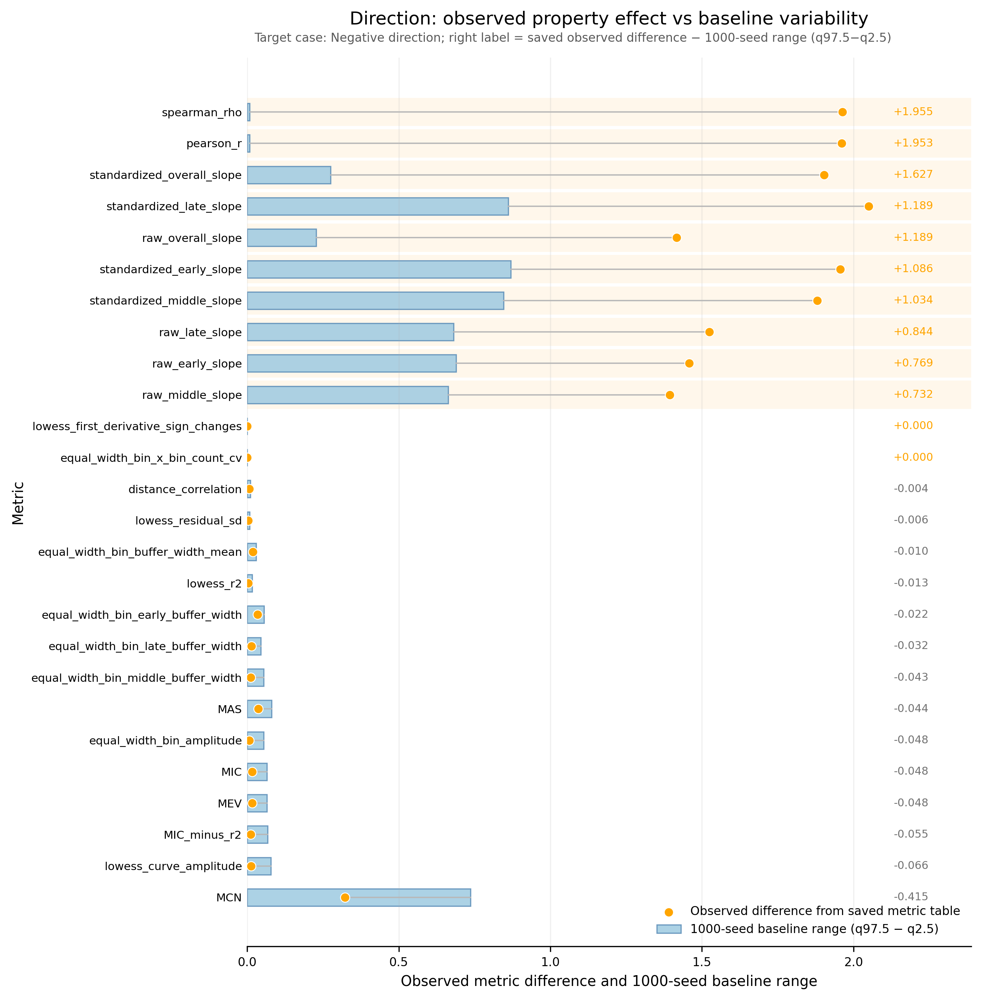

Plotting normalized figure: Direction
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Direction_normalized_selected_metrics.png


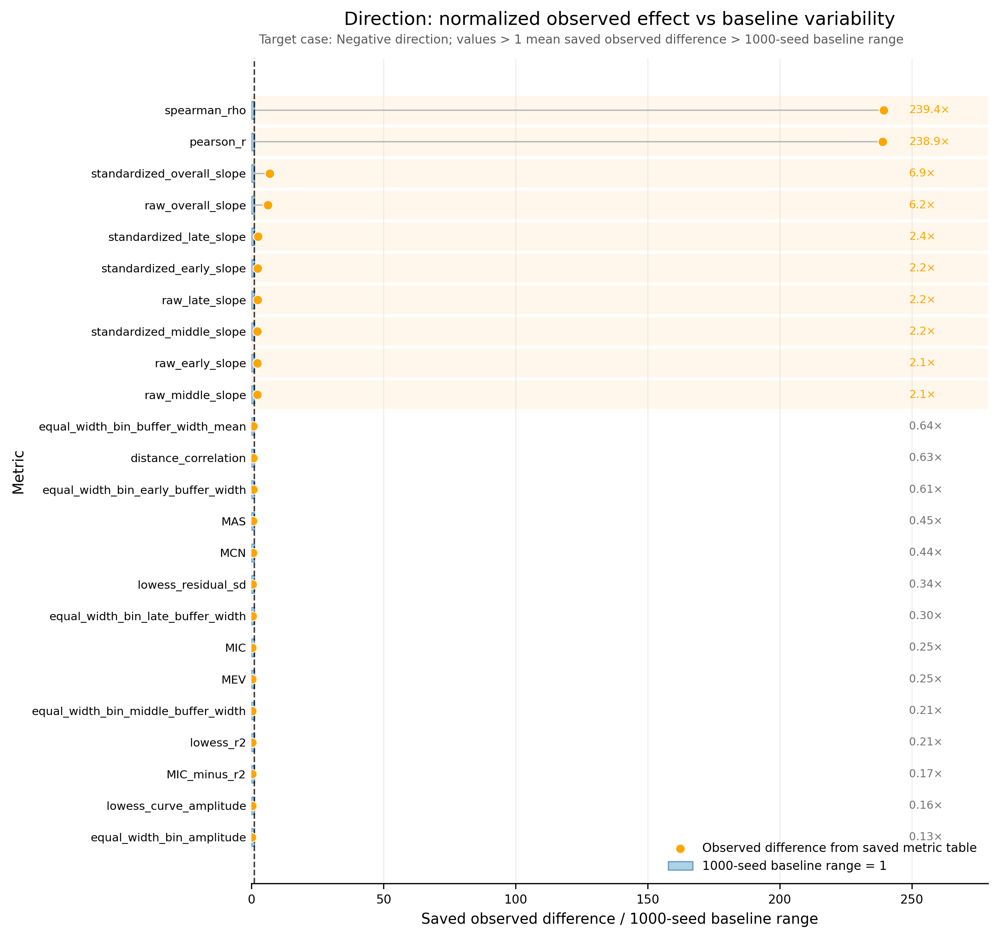

Plotting raw figure: Monotonicity
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Monotonicity_raw_selected_metrics.png


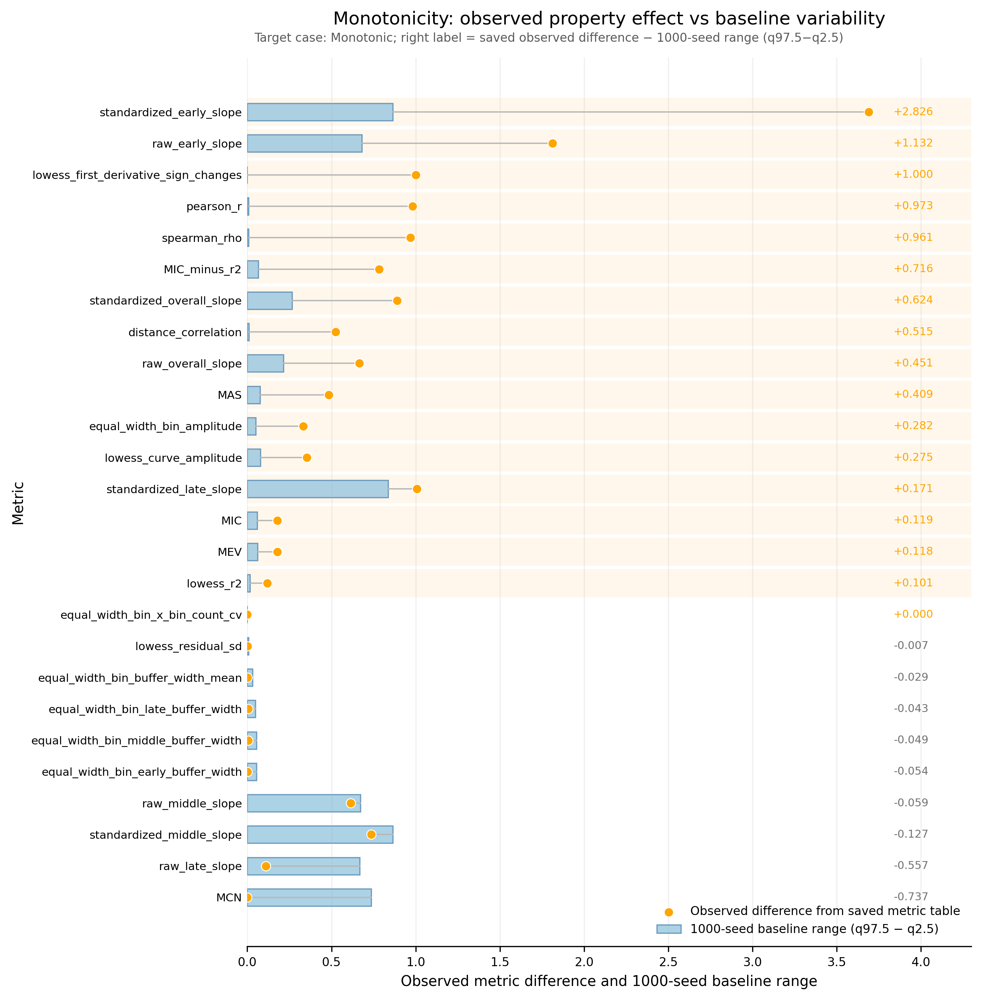

Plotting normalized figure: Monotonicity
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Monotonicity_normalized_selected_metrics.png


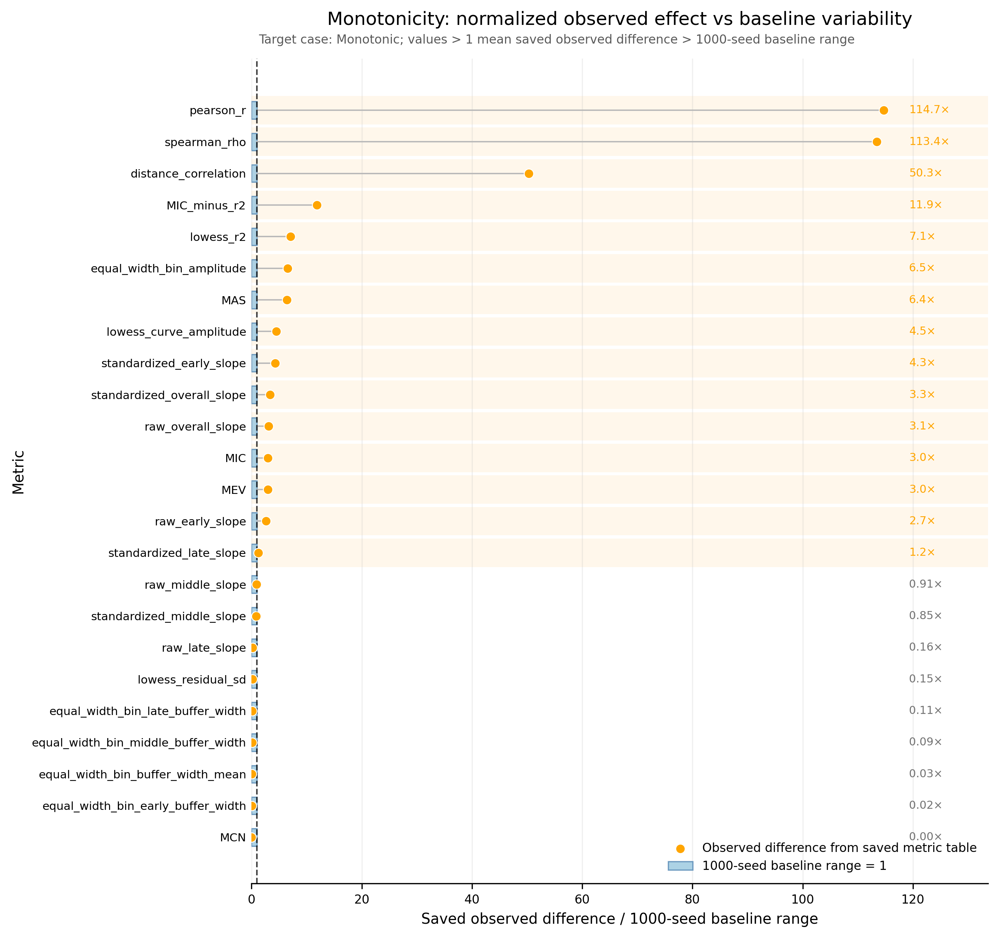

Plotting raw figure: Strength
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Strength_raw_selected_metrics.png


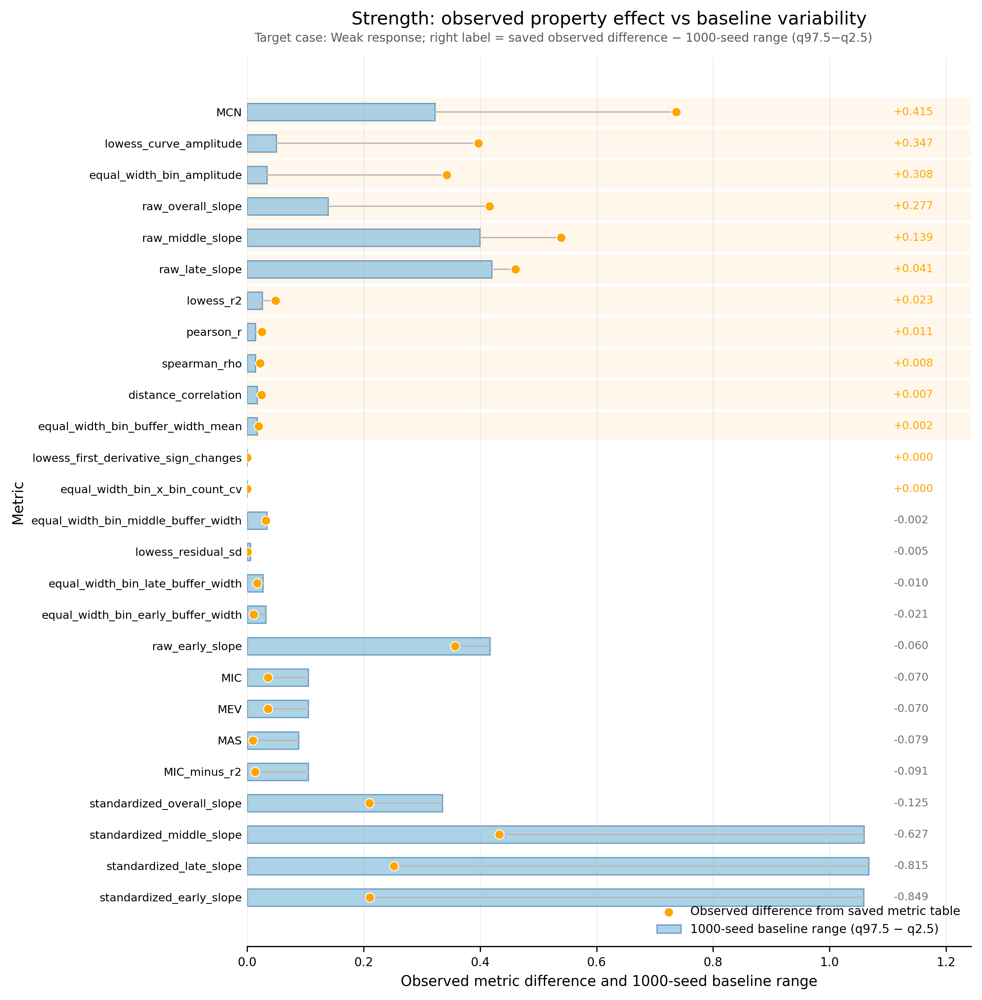

Plotting normalized figure: Strength
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Strength_normalized_selected_metrics.png


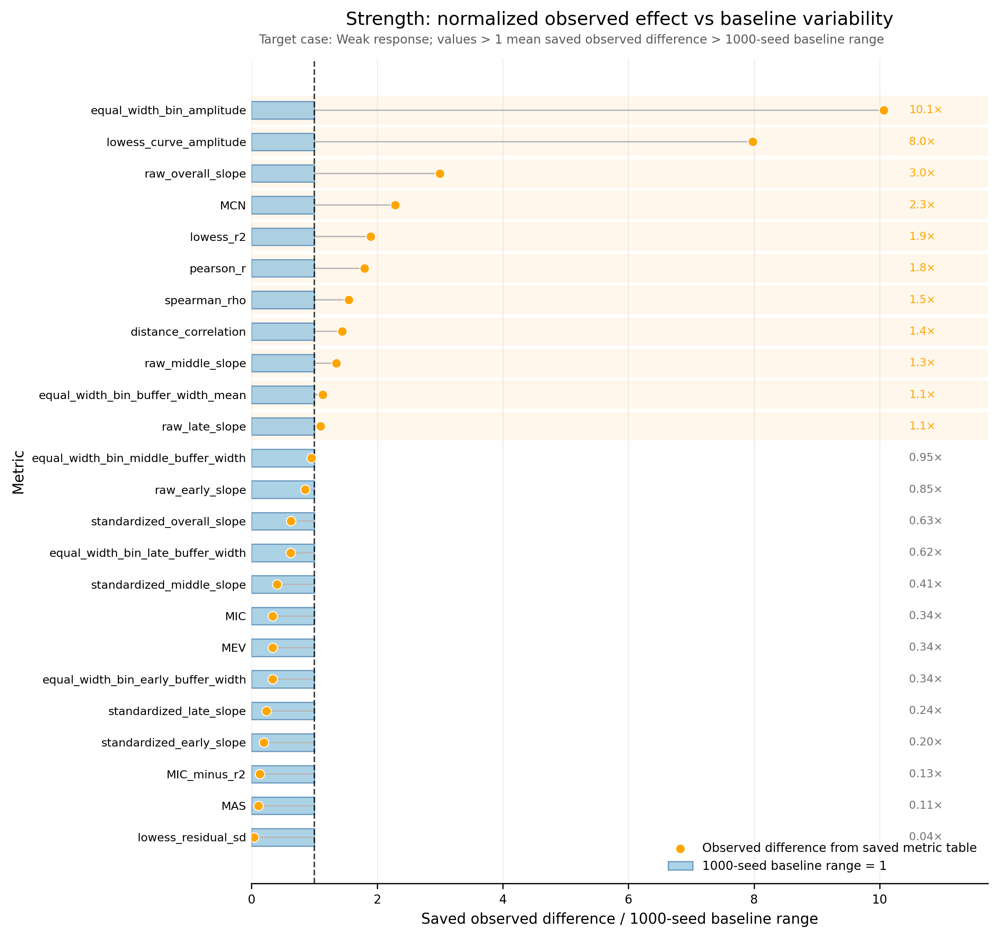

Plotting raw figure: Non-linearity
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Non_linearity_raw_selected_metrics.png


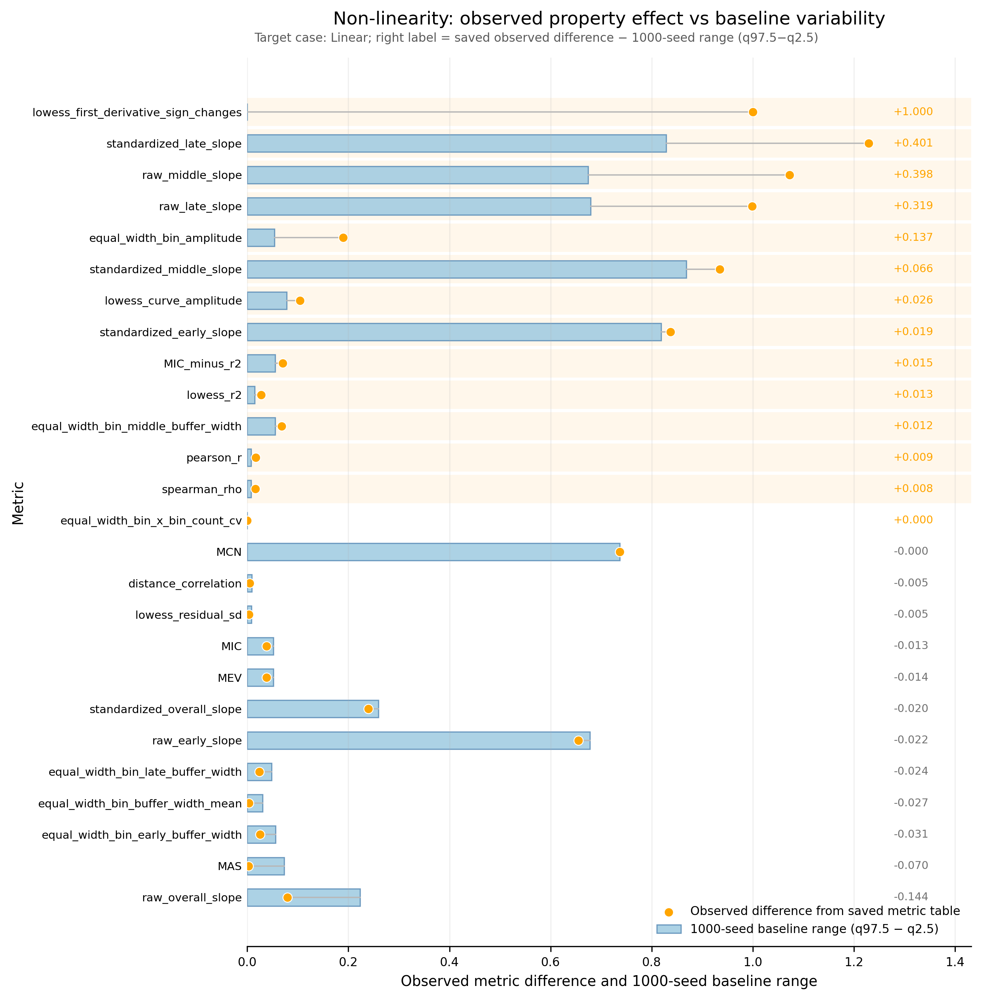

Plotting normalized figure: Non-linearity
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Non_linearity_normalized_selected_metrics.png


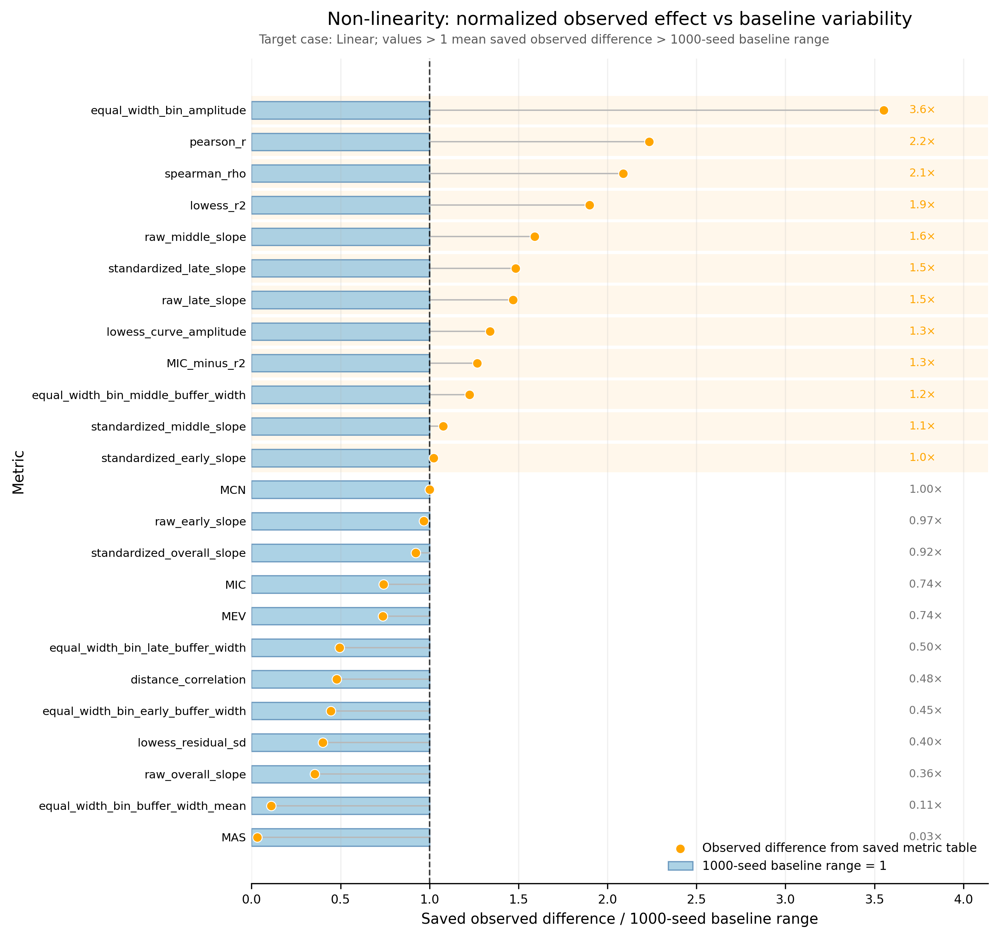

Plotting raw figure: Convexity
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Convexity_raw_selected_metrics.png


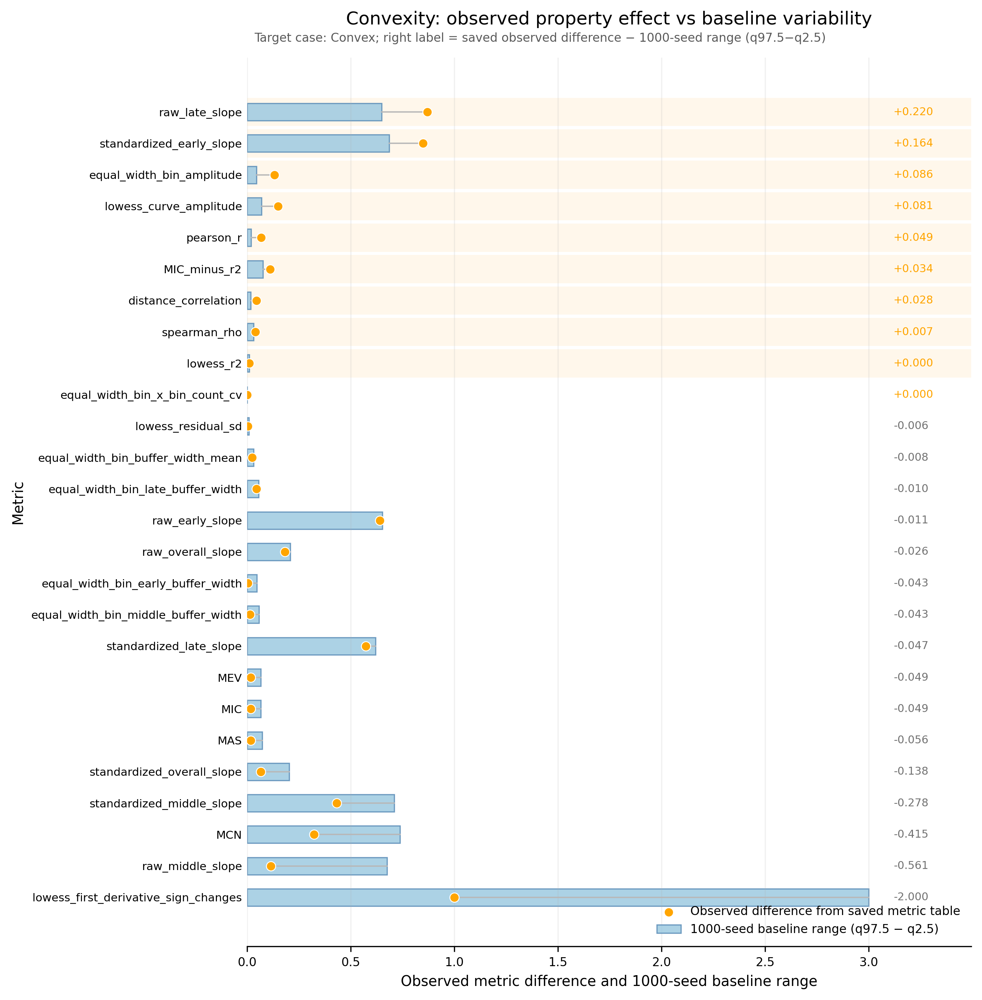

Plotting normalized figure: Convexity
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Convexity_normalized_selected_metrics.png


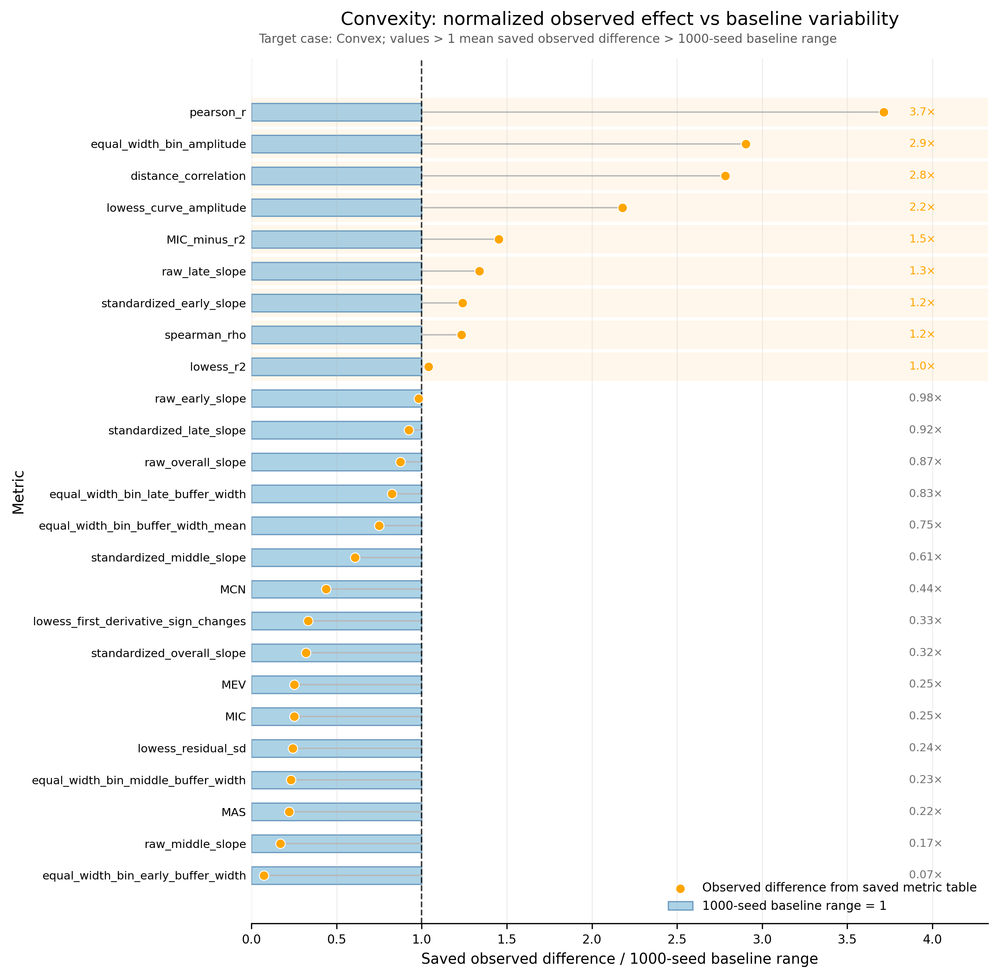

Plotting raw figure: Concavity
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Concavity_raw_selected_metrics.png


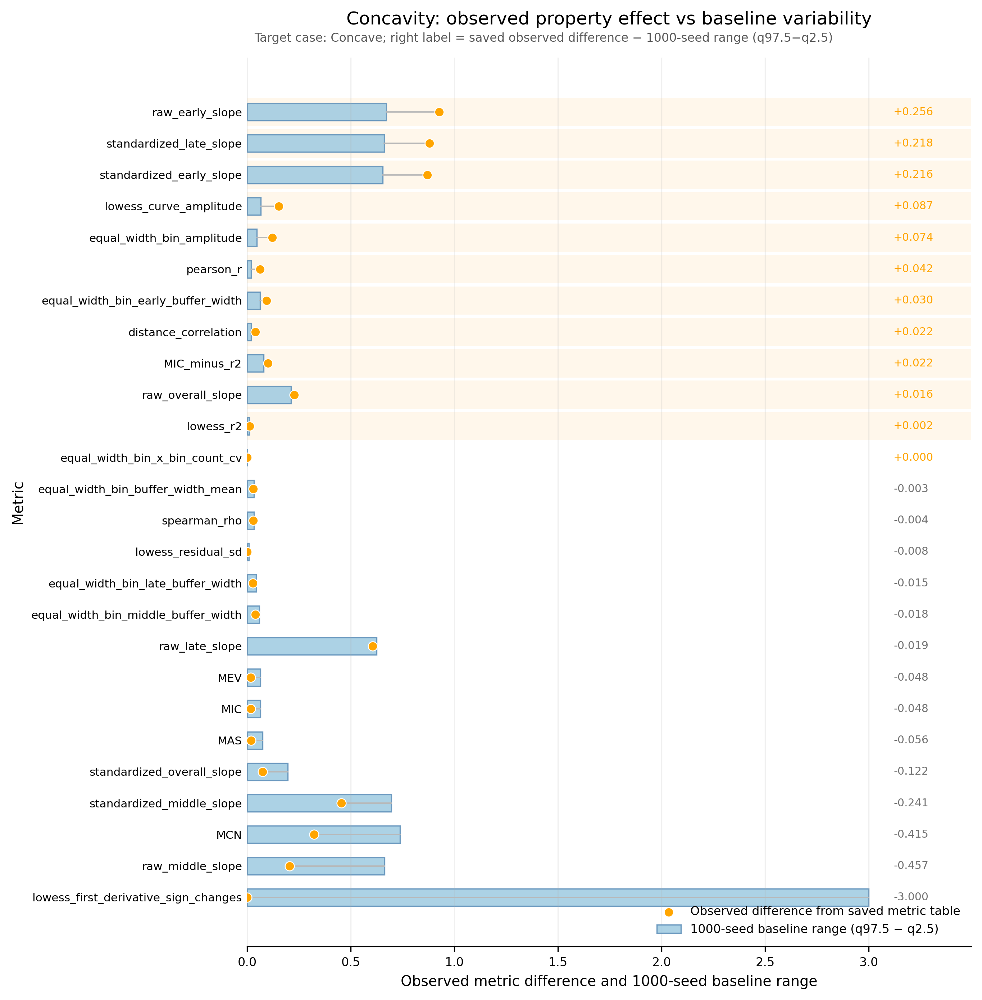

Plotting normalized figure: Concavity
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Concavity_normalized_selected_metrics.png


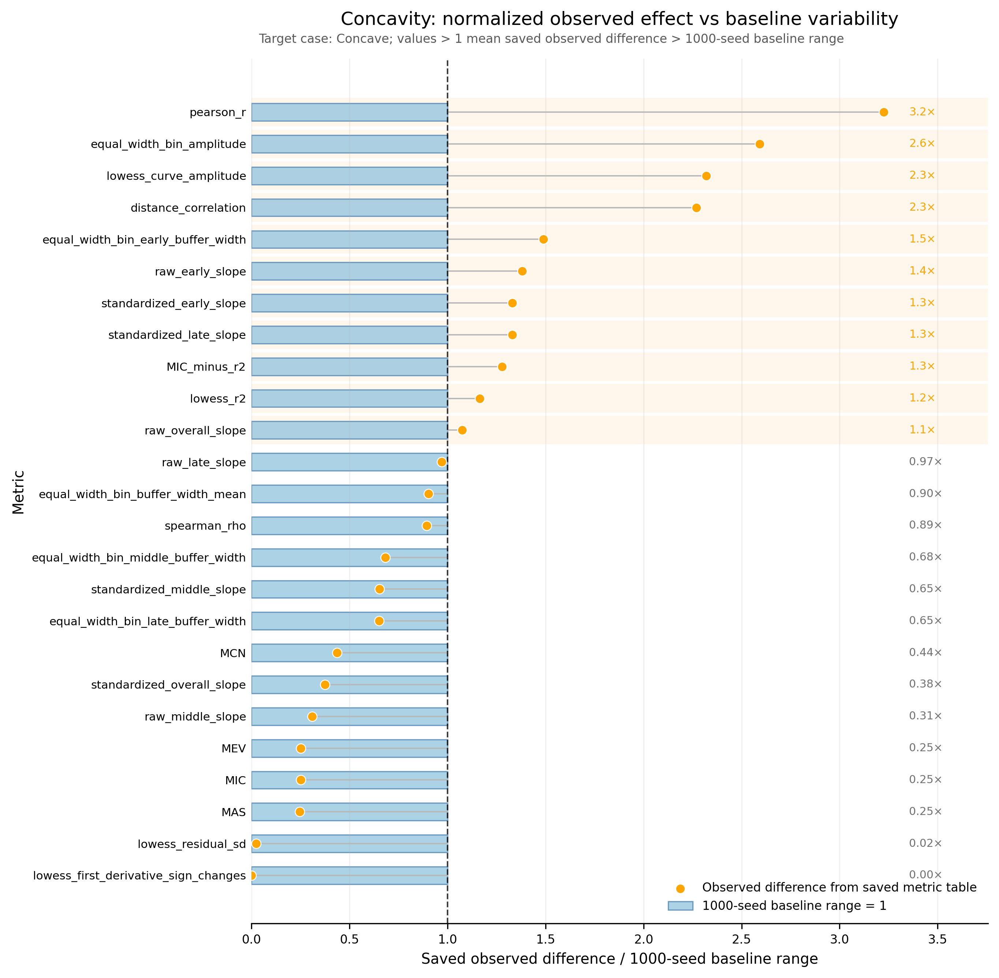

Plotting raw figure: Saturation
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Saturation_raw_selected_metrics.png


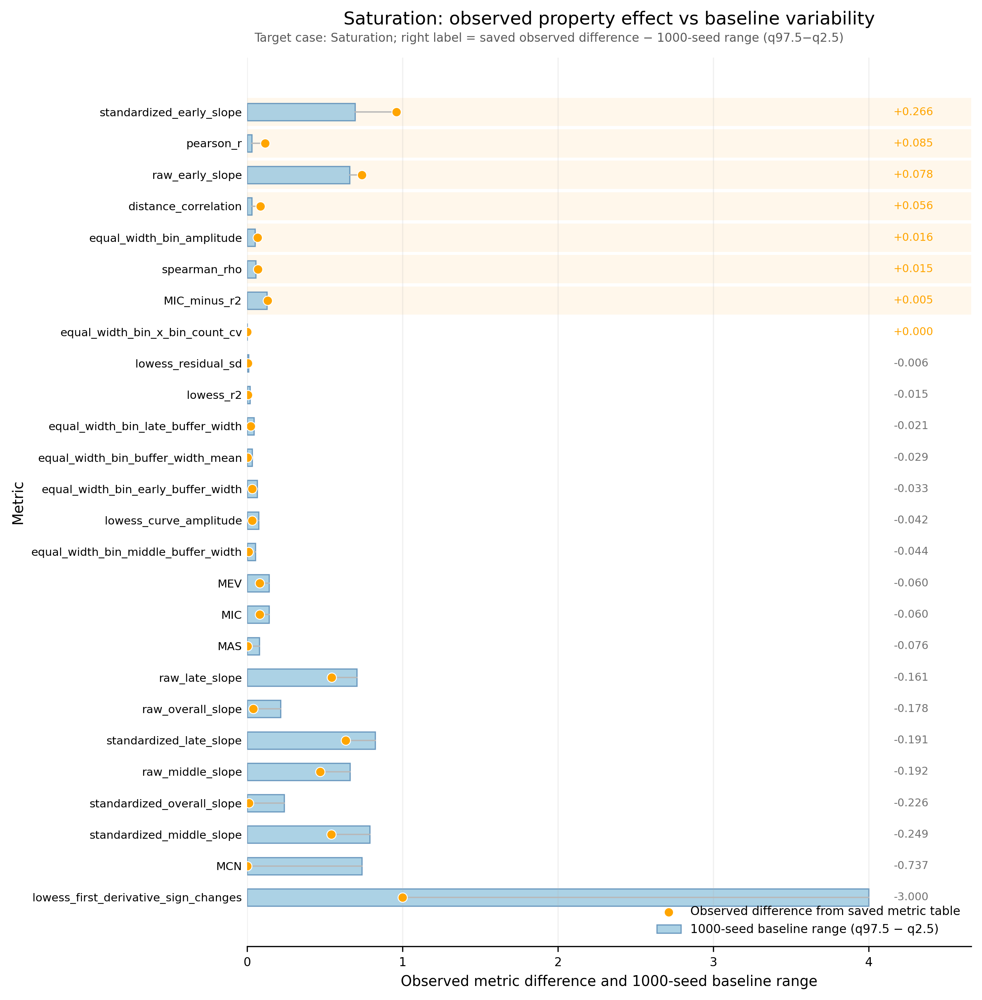

Plotting normalized figure: Saturation
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Saturation_normalized_selected_metrics.png


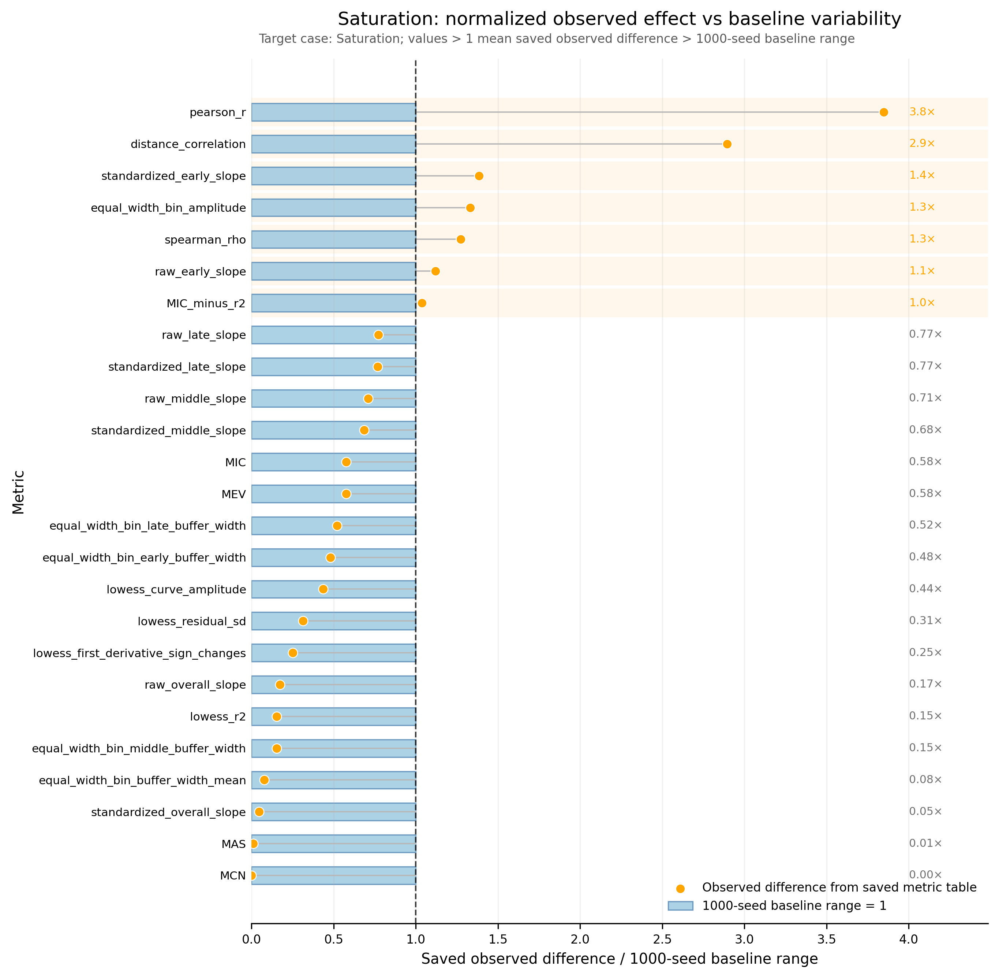

Plotting raw figure: Turning point
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Turning_point_raw_selected_metrics.png


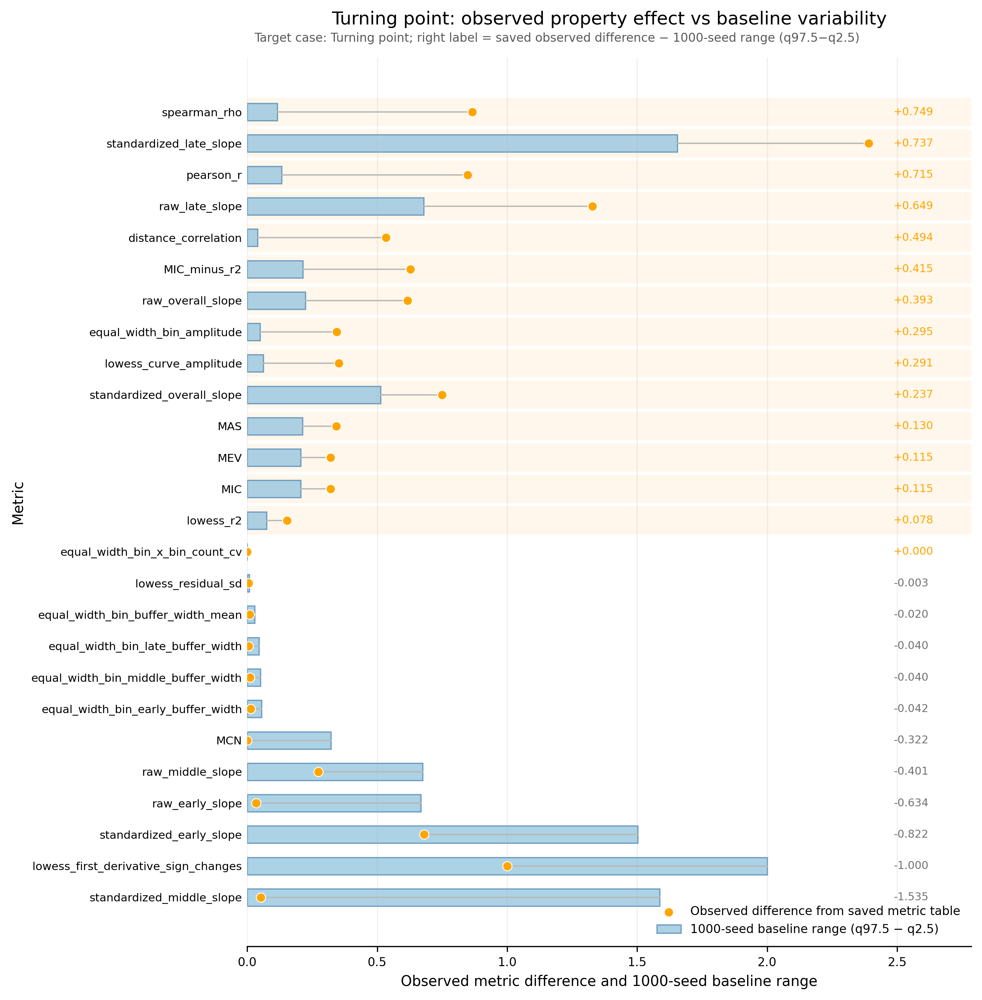

Plotting normalized figure: Turning point
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Turning_point_normalized_selected_metrics.png


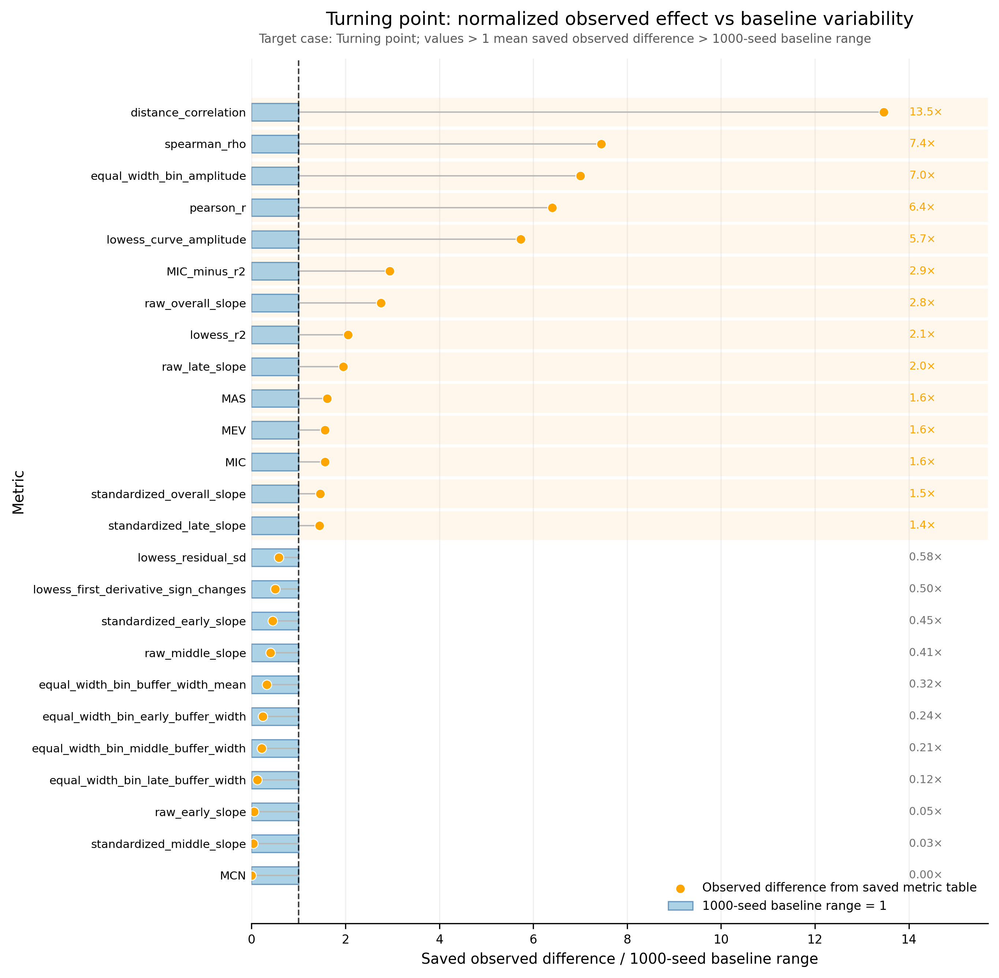

Plotting raw figure: Threshold
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Threshold_raw_selected_metrics.png


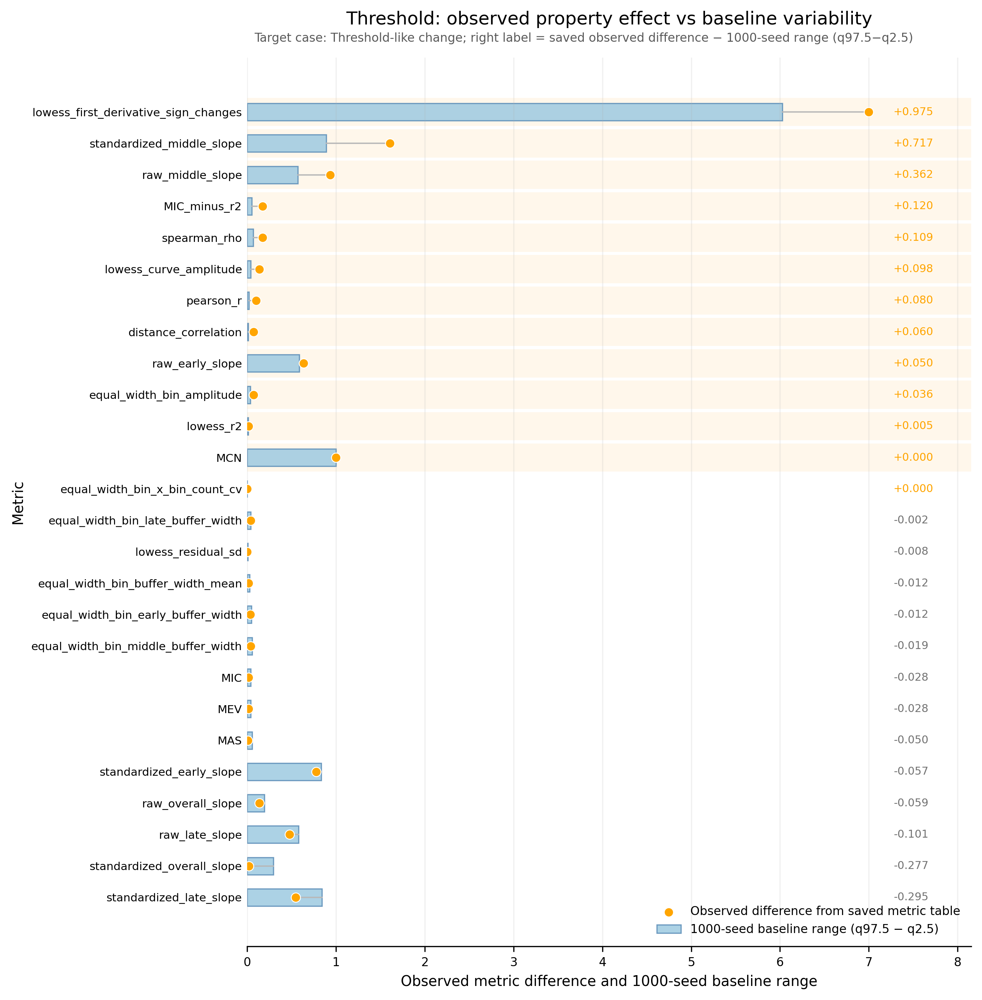

Plotting normalized figure: Threshold
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Threshold_normalized_selected_metrics.png


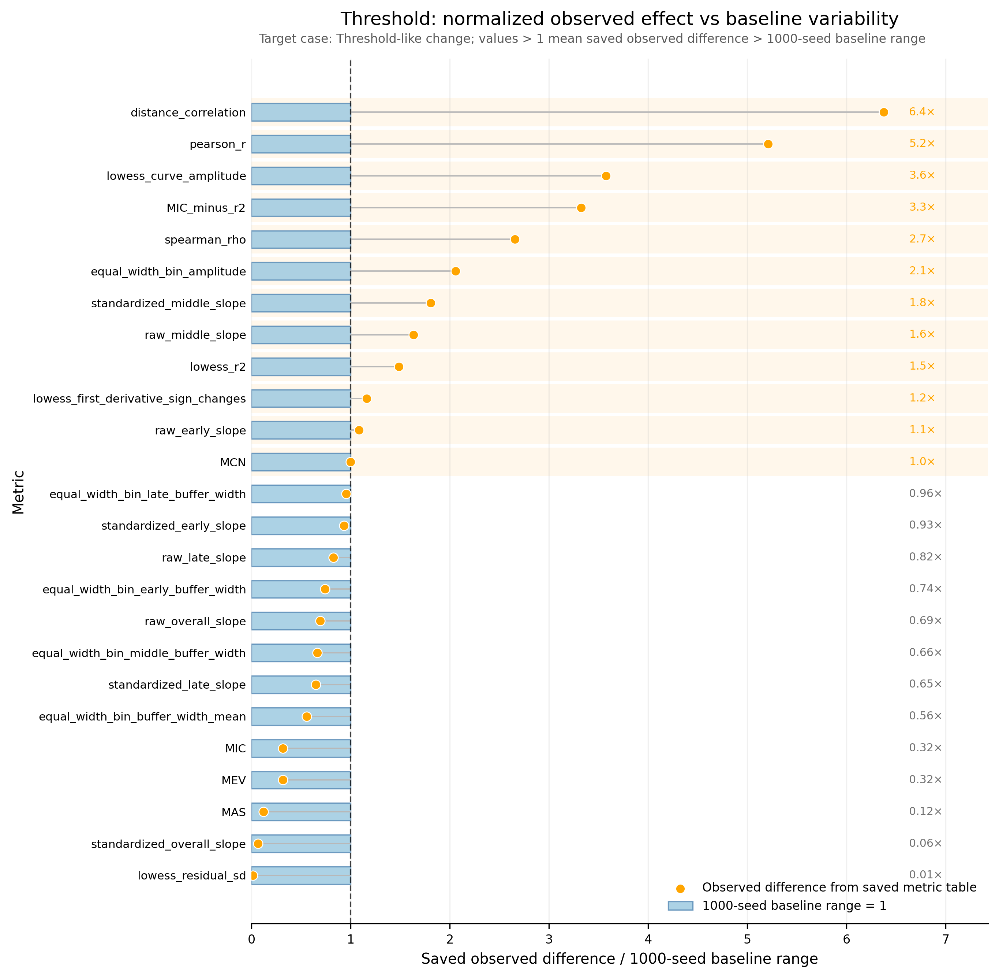

Plotting raw figure: Spread
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Spread_raw_selected_metrics.png


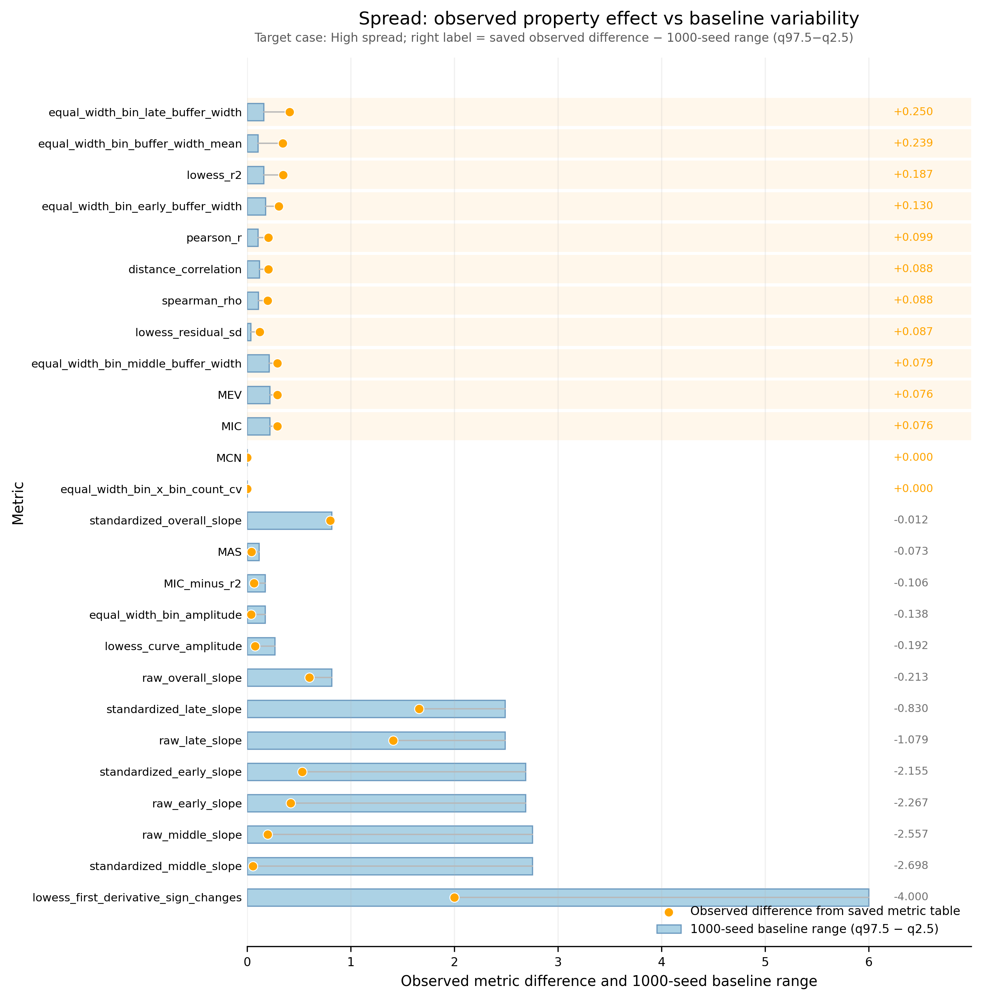

Plotting normalized figure: Spread
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Spread_normalized_selected_metrics.png


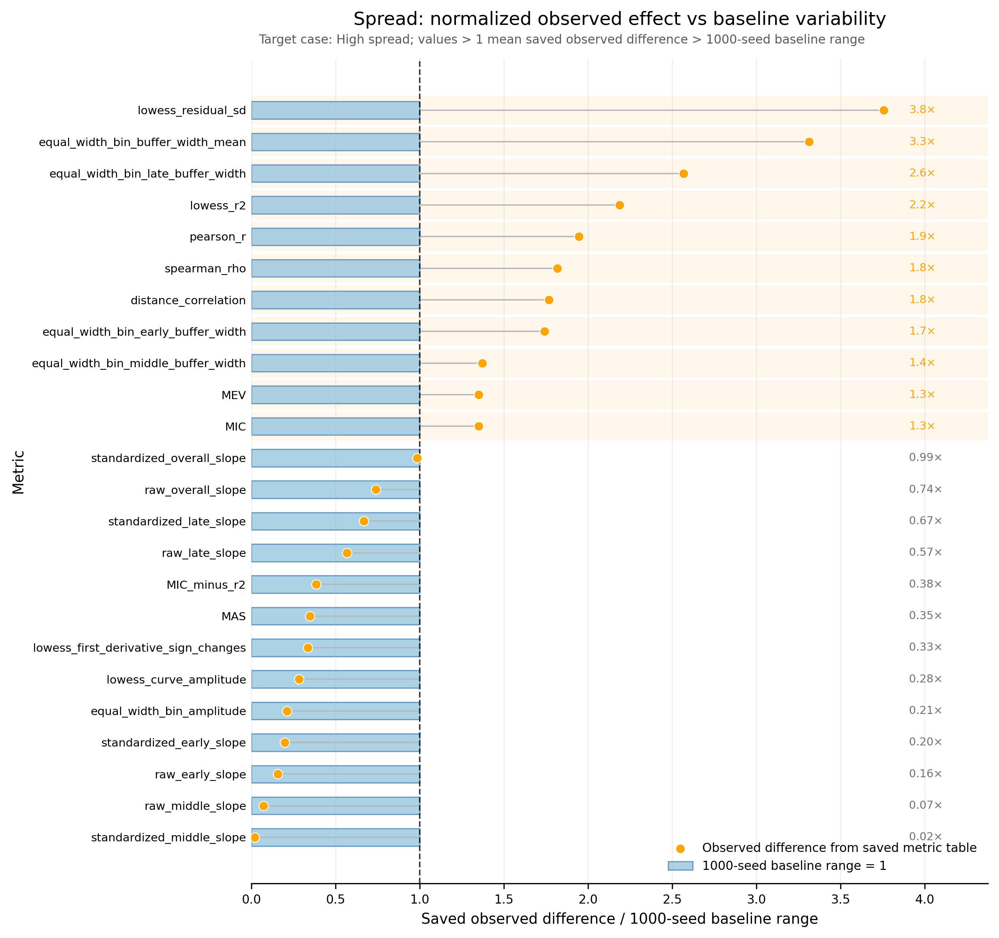

Plotting raw figure: Heteroscedasticity
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Heteroscedasticity_raw_selected_metrics.png


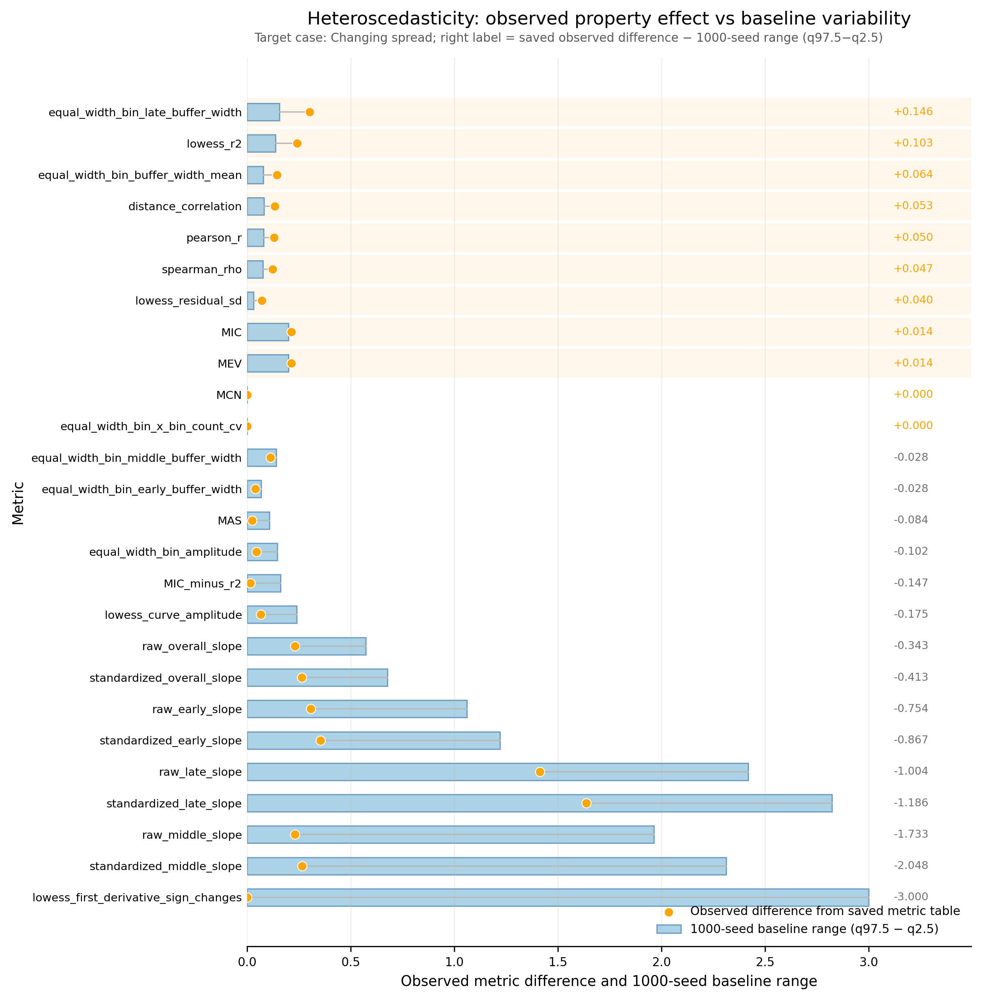

Plotting normalized figure: Heteroscedasticity
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Heteroscedasticity_normalized_selected_metrics.png


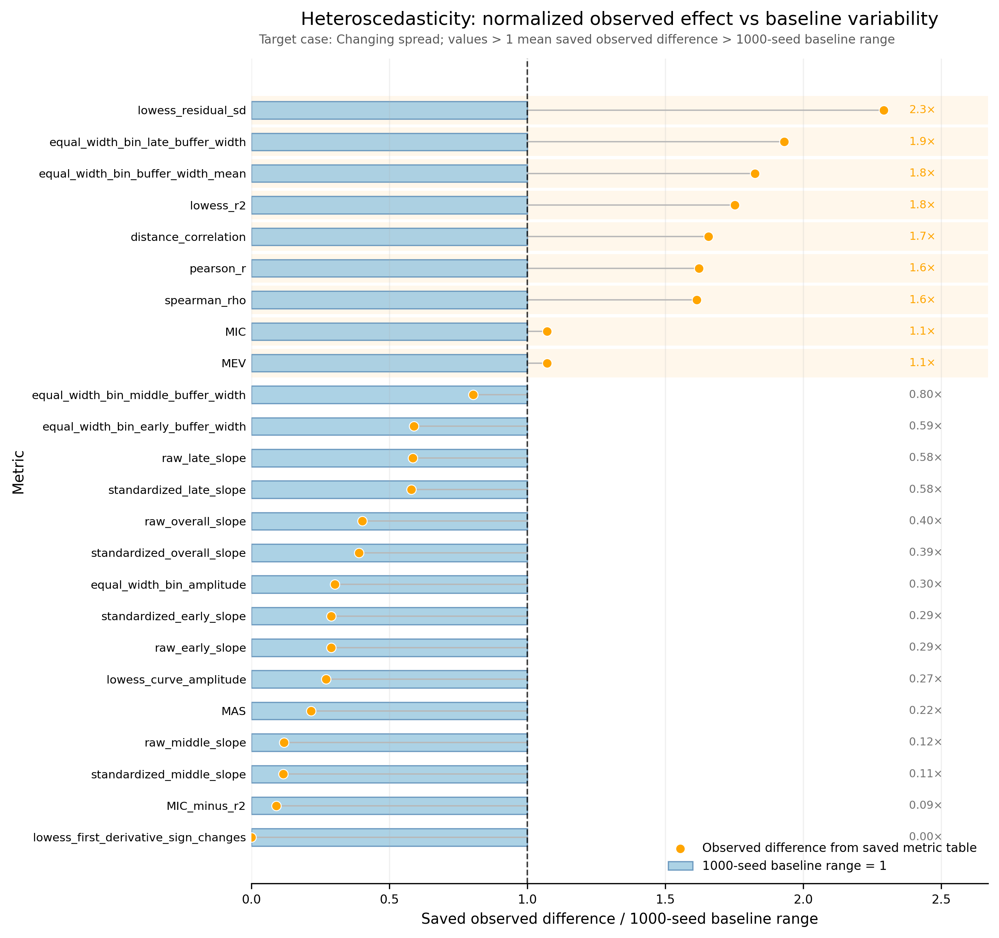

Plotting raw figure: Density
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Density_raw_selected_metrics.png


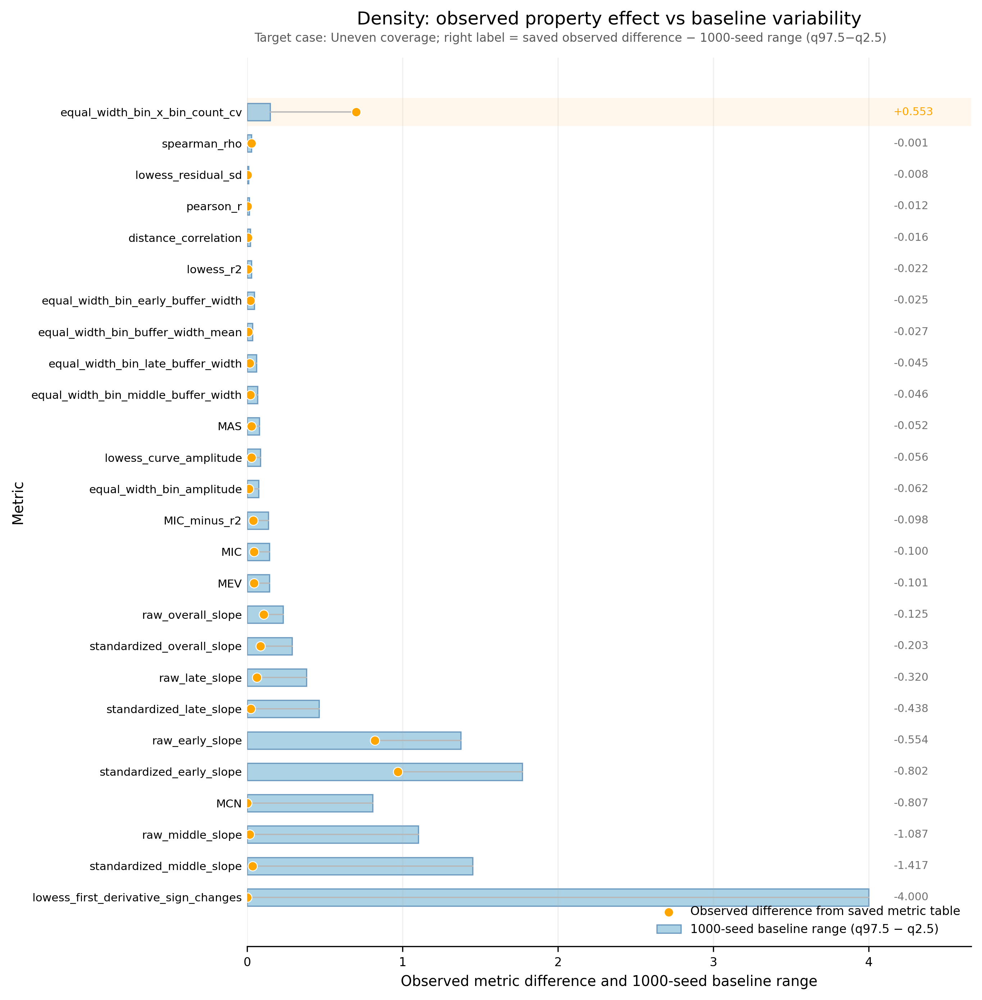

Plotting normalized figure: Density
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Density_normalized_selected_metrics.png


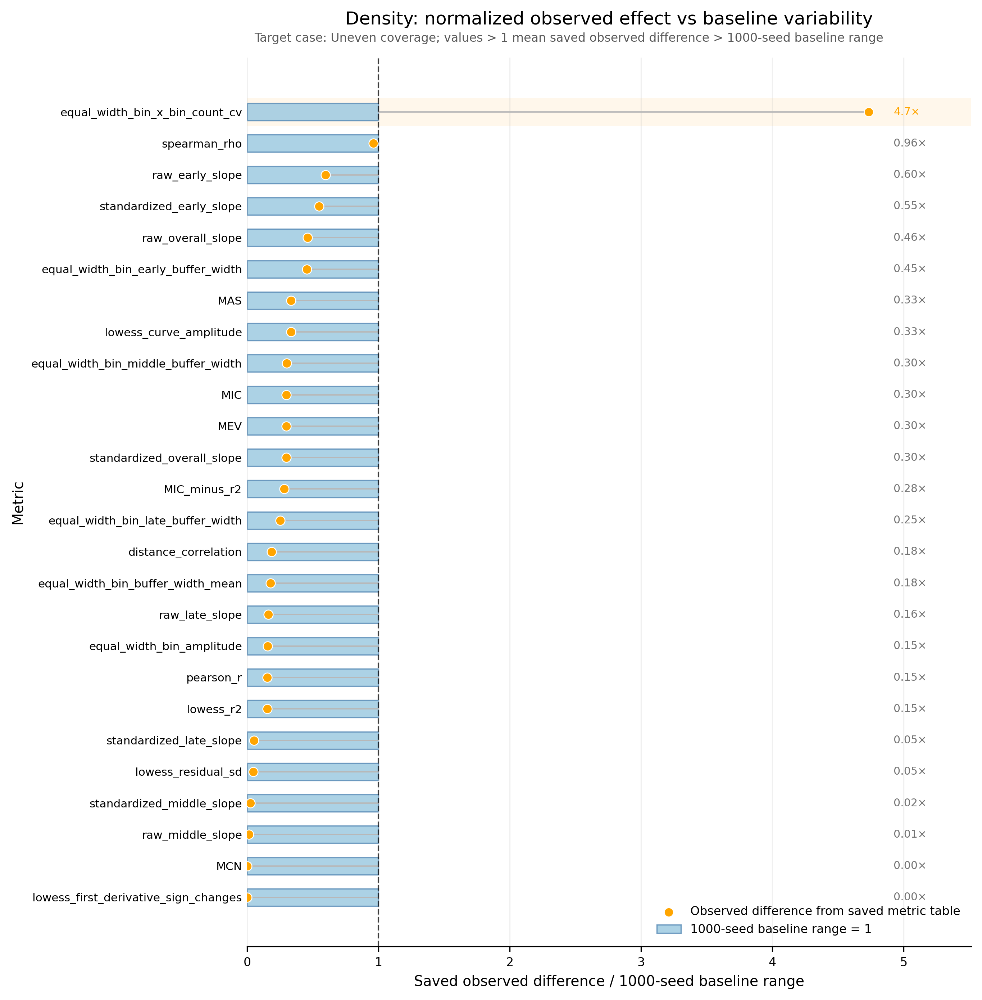

Plotting raw figure: Clustering
Saved raw figure: ./property_baseline_outputs/figures_selected_metrics/Clustering_raw_selected_metrics.png


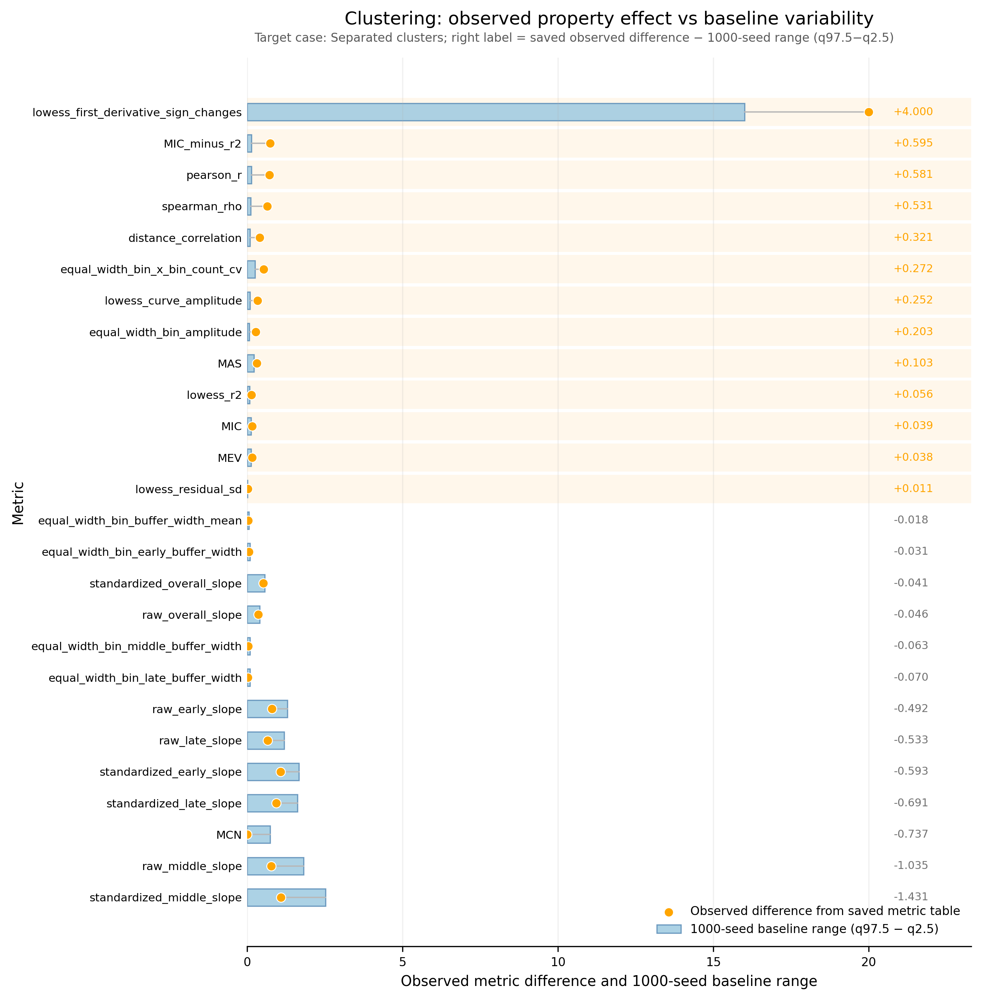

Plotting normalized figure: Clustering
Saved normalized figure: ./property_baseline_outputs/figures_selected_metrics/Clustering_normalized_selected_metrics.png


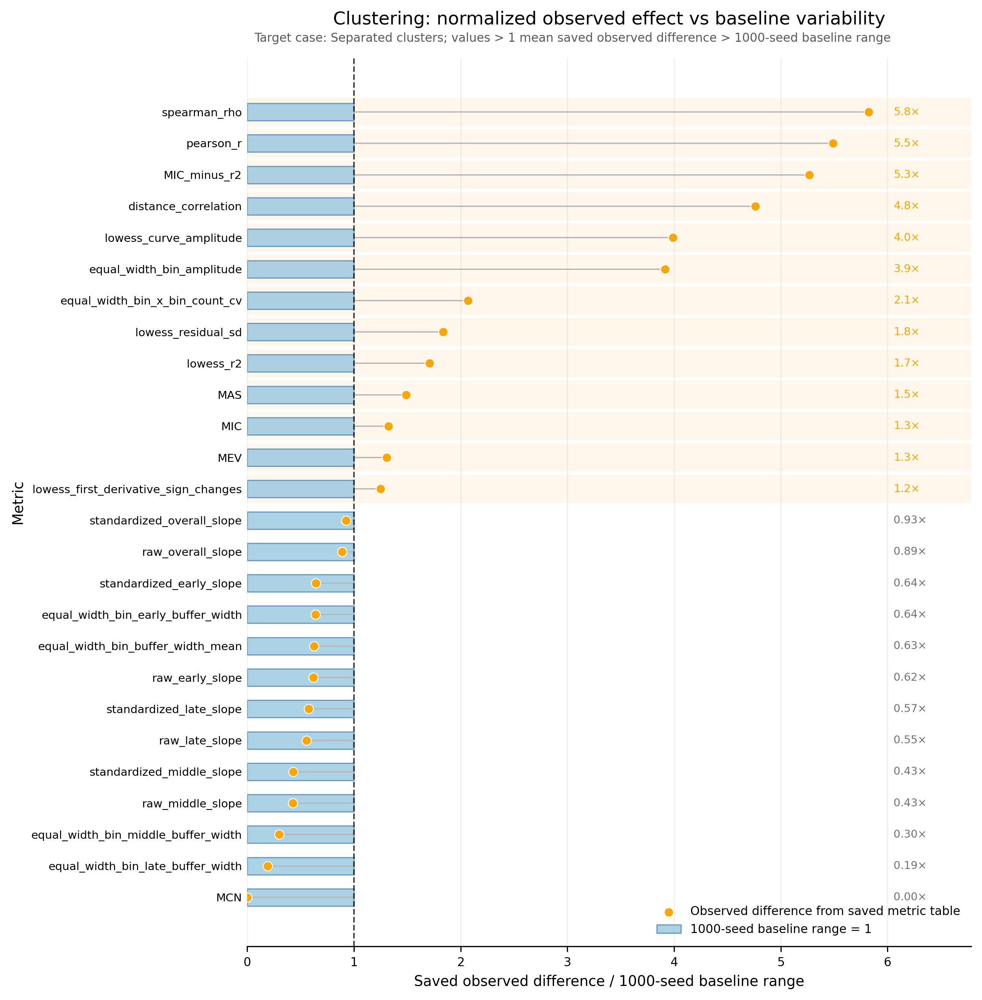

All selected-metric figures saved to: ./property_baseline_outputs/figures_selected_metrics
Saved orange > blue selected metrics: ./property_baseline_outputs/all_properties_orange_gt_blue_selected_metrics.csv


,property,case_a_source_property,case_b_source_property,case_a,case_b,metric,case_a_value,case_b_value,observed_difference,baseline_source_property,...,baseline_q025,baseline_q975,baseline_95_width,baseline_range,baseline_n_valid,ratio_to_baseline_95_width,ratio_to_baseline_sd,larger_than_baseline_95_width,larger_than_baseline_range,observed_minus_baseline95
0,Clustering,Clustering,Clustering,Single cloud,Separated clusters,lowess_first_derivative_sign_changes,0.0000,20.0000,20.0000,Clustering,...,6.000000,22.000000,16.000000,28.000000,1000,1.250000,4.819804,True,False,4.000000
1,Clustering,Clustering,Clustering,Single cloud,Separated clusters,MIC_minus_r2,0.0292,0.7642,0.7350,Clustering,...,0.619903,0.759487,0.139584,0.211843,1000,5.265662,20.704204,True,True,0.595416
2,Clustering,Clustering,Clustering,Single cloud,Separated clusters,pearson_r,0.9853,0.2750,0.7103,Clustering,...,0.236104,0.365474,0.129370,0.205587,1000,5.490442,21.239398,True,True,0.580930
3,Clustering,Clustering,Clustering,Single cloud,Separated clusters,spearman_rho,0.9826,0.3416,0.6410,Clustering,...,0.280863,0.390918,0.110055,0.176118,1000,5.824356,22.108310,True,True,0.530945
4,Clustering,Clustering,Clustering,Single cloud,Separated clusters,distance_correlation,0.9824,0.5765,0.4059,Clustering,...,0.549900,0.635168,0.085268,0.139174,1000,4.760266,18.223290,True,True,0.320632
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,Turning point,Turning point,Turning point,No turning point,Turning point,standardized_overall_slope,0.8875,0.1381,0.7494,Turning point,...,-0.154510,0.358008,0.512518,0.833814,1000,1.462193,5.611615,True,False,0.236882
133,Turning point,Turning point,Turning point,No turning point,Turning point,MAS,0.0306,0.3730,0.3424,Turning point,...,0.354235,0.566374,0.212139,0.343544,1000,1.614036,6.186447,True,False,0.130261
134,Turning point,Turning point,Turning point,No turning point,Turning point,MEV,1.0000,0.6795,0.3205,Turning point,...,0.665279,0.870376,0.205096,0.326008,1000,1.562679,5.910287,True,False,0.115404
135,Turning point,Turning point,Turning point,No turning point,Turning point,MIC,1.0000,0.6795,0.3205,Turning point,...,0.665279,0.870376,0.205096,0.326008,1000,1.562679,5.910287,True,False,0.115404


Saved top 3 selected normalized metrics: ./property_baseline_outputs/top3_normalized_selected_metrics_by_property.csv
Saved top 5 selected normalized metrics: ./property_baseline_outputs/top5_normalized_selected_metrics_by_property.csv


/var/folders/y6/36h2pwl51ql85zwkh35jmm1r0000gp/T/ipykernel_80041/4283029228.py:732: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  normalized_df


,property,rank_within_property,top_k,metric,case_a,case_b,baseline_case,observed_difference,baseline_95_width,observed_ratio,...,observed_minus_baseline95,case_a_value,case_b_value,baseline_mean,baseline_sd,baseline_q025,baseline_q975,baseline_min,baseline_max,baseline_range
0,Clustering,1,3,spearman_rho,Single cloud,Separated clusters,Separated clusters,0.6410,0.110055,5.824356,...,0.530945,0.9826,0.3416,0.336877,0.028994,0.280863,0.390918,0.230076,0.406193,0.176118
1,Clustering,2,3,pearson_r,Single cloud,Separated clusters,Separated clusters,0.7103,0.129370,5.490442,...,0.580930,0.9853,0.2750,0.301542,0.033443,0.236104,0.365474,0.194819,0.400406,0.205587
2,Clustering,3,3,MIC_minus_r2,Single cloud,Separated clusters,Separated clusters,0.7350,0.139584,5.265662,...,0.595416,0.0292,0.7642,0.690183,0.035500,0.619903,0.759487,0.588477,0.800320,0.211843
3,Concavity,1,3,pearson_r,Positive direction,Concave,Concave,0.0612,0.018974,3.225536,...,0.042226,0.9816,0.9204,0.914519,0.004863,0.905136,0.924110,0.897882,0.929434,0.031552
4,Concavity,2,3,equal_width_bin_amplitude,Positive direction,Concave,Concave,0.1204,0.046446,2.592275,...,0.073954,0.6154,0.7358,0.754706,0.011935,0.730681,0.777127,0.715580,0.795583,0.080003
5,Concavity,3,3,lowess_curve_amplitude,Positive direction,Concave,Concave,0.1526,0.065770,2.320220,...,0.086830,0.6817,0.8343,0.855604,0.016905,0.824957,0.890727,0.804572,0.907526,0.102954
6,Convexity,1,3,pearson_r,Positive direction,Convex,Convex,0.0669,0.018008,3.715031,...,0.048892,0.9816,0.9147,0.914868,0.004595,0.905752,0.923760,0.899570,0.927068,0.027498
7,Convexity,2,3,equal_width_bin_amplitude,Positive direction,Convex,Convex,0.1308,0.045031,2.904643,...,0.085769,0.6154,0.7462,0.755994,0.011764,0.733659,0.778691,0.713419,0.794919,0.081500
8,Convexity,3,3,distance_correlation,Positive direction,Convex,Convex,0.0441,0.015844,2.783357,...,0.028256,0.9809,0.9368,0.936497,0.004059,0.928085,0.943929,0.923299,0.947551,0.024251
9,Density,1,3,equal_width_bin_x_bin_count_cv,Even coverage,Uneven coverage,Uneven coverage,0.7010,0.148029,4.735555,...,0.552971,0.0000,0.7010,0.699105,0.036944,0.627436,0.775465,0.582983,0.837877,0.254894


,property,rank_within_property,top_k,metric,case_a,case_b,baseline_case,observed_difference,baseline_95_width,observed_ratio,...,observed_minus_baseline95,case_a_value,case_b_value,baseline_mean,baseline_sd,baseline_q025,baseline_q975,baseline_min,baseline_max,baseline_range
0,Clustering,1,5,spearman_rho,Single cloud,Separated clusters,Separated clusters,0.6410,0.110055,5.824356,...,0.530945,0.9826,0.3416,0.336877,0.028994,0.280863,0.390918,0.230076,0.406193,0.176118
1,Clustering,2,5,pearson_r,Single cloud,Separated clusters,Separated clusters,0.7103,0.129370,5.490442,...,0.580930,0.9853,0.2750,0.301542,0.033443,0.236104,0.365474,0.194819,0.400406,0.205587
2,Clustering,3,5,MIC_minus_r2,Single cloud,Separated clusters,Separated clusters,0.7350,0.139584,5.265662,...,0.595416,0.0292,0.7642,0.690183,0.035500,0.619903,0.759487,0.588477,0.800320,0.211843
3,Clustering,4,5,distance_correlation,Single cloud,Separated clusters,Separated clusters,0.4059,0.085268,4.760266,...,0.320632,0.9824,0.5765,0.591182,0.022274,0.549900,0.635168,0.520844,0.660018,0.139174
4,Clustering,5,5,lowess_curve_amplitude,Single cloud,Separated clusters,Separated clusters,0.3357,0.084173,3.988209,...,0.251527,0.6429,0.3072,0.336483,0.021665,0.302187,0.386361,0.284705,0.444084,0.159379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,Turning point,1,5,distance_correlation,No turning point,Turning point,Turning point,0.5337,0.039631,13.466753,...,0.494069,0.9836,0.4499,0.457590,0.009828,0.439170,0.478801,0.423652,0.489930,0.066278
61,Turning point,2,5,spearman_rho,No turning point,Turning point,Turning point,0.8652,0.116142,7.449501,...,0.749058,0.9851,0.1199,0.108990,0.029121,0.050562,0.166704,0.013479,0.195337,0.181858
62,Turning point,3,5,equal_width_bin_amplitude,No turning point,Turning point,Turning point,0.3447,0.049236,7.000906,...,0.295464,0.6014,0.2567,0.248184,0.012439,0.224028,0.273264,0.204818,0.290723,0.085905
63,Turning point,4,5,pearson_r,No turning point,Turning point,Turning point,0.8477,0.132348,6.405074,...,0.715352,0.9835,0.1358,0.138113,0.033520,0.070302,0.202651,0.023301,0.254450,0.231149


Saved selected top metrics Excel: ./property_baseline_outputs/top_normalized_selected_metrics_by_property.xlsx


In [8]:
# ==========================================================
# Plot and save selected metrics only
#
# Use after you have already generated:
#   all_property_results
#   all_comparison_df
#   properties_to_run
#
# Figures:
#   Raw-scale figure
#   Normalized figure
#
# Metric filter:
#   Keep previous core metrics + MI + derived buffer metrics
# ==========================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ==========================================================
# 0. Output directories
# ==========================================================

output_dir = "./property_baseline_outputs"
figure_dir = "./property_baseline_outputs/figures_selected_metrics"

os.makedirs(output_dir, exist_ok=True)
os.makedirs(figure_dir, exist_ok=True)


# ==========================================================
# 1. Selected metrics for plotting and ranking
# ==========================================================

SELECTED_METRICS_FOR_PLOT = [
    # ------------------------------------------------------
    # Correlation-based
    # ------------------------------------------------------
    "pearson_r",
    "spearman_rho",

    # ------------------------------------------------------
    # Distance-based
    # ------------------------------------------------------
    "distance_correlation",

    # ------------------------------------------------------
    # Slope-based
    # ------------------------------------------------------
    "raw_overall_slope",
    "raw_early_slope",
    "raw_middle_slope",
    "raw_late_slope",

    "standardized_overall_slope",
    "standardized_early_slope",
    "standardized_middle_slope",
    "standardized_late_slope",

    # ------------------------------------------------------
    # Information-based
    # ------------------------------------------------------
    # "MI",
    "MIC",
    "MAS",
    "MEV",
    "MCN",
    "MIC_minus_r2",

    # ------------------------------------------------------
    # Bin-based
    # ------------------------------------------------------
    "equal_width_bin_amplitude",
    # "equal_width_bin_eta_squared",

    "equal_width_bin_buffer_width_mean",
    "equal_width_bin_early_buffer_width",
    "equal_width_bin_middle_buffer_width",
    "equal_width_bin_late_buffer_width",

    "equal_width_bin_x_bin_count_cv",

    # ------------------------------------------------------
    # Derived buffer metrics for Heteroscedasticity
    # ------------------------------------------------------
    # "equal_width_bin_late_minus_early_buffer_width",
    # "equal_width_bin_late_minus_middle_buffer_width",
    # "equal_width_bin_buffer_width_segment_range",
    # "equal_width_bin_buffer_width_segment_cv",
    # "equal_width_bin_late_div_early_buffer_width",

    # ------------------------------------------------------
    # Curve-based
    # ------------------------------------------------------
    "lowess_residual_sd",
    "lowess_curve_amplitude",
    "lowess_r2",
    "lowess_first_derivative_sign_changes",
]


def filter_selected_metrics(df):
    """
    Keep only selected metrics.
    """

    df = df.copy()

    df = df[
        df["metric"].isin(SELECTED_METRICS_FOR_PLOT)
    ].copy()

    return df


# ==========================================================
# 2. Helper functions
# ==========================================================

def make_safe_filename(name):
    return (
        name
        .replace("/", "_")
        .replace("\\", "_")
        .replace(" ", "_")
        .replace("-", "_")
        .replace(":", "_")
    )


def get_case_info_from_result(result):
    comparison_df = result["comparison_df"]

    if "case_a" in comparison_df.columns:
        case_a = comparison_df["case_a"].dropna().iloc[0]
    else:
        case_a = "case A"

    if "case_b" in comparison_df.columns:
        case_b = comparison_df["case_b"].dropna().iloc[0]
    else:
        case_b = "case B"

    if "baseline_case" in comparison_df.columns:
        baseline_case = comparison_df["baseline_case"].dropna().iloc[0]
    else:
        baseline_case = "target case"

    return case_a, case_b, baseline_case


# ==========================================================
# 3. Raw-scale plot for one property
# ==========================================================

def plot_property_baseline_raw_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    if property_name not in all_property_results:
        print(f"{property_name} not found.")
        return

    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a, case_b, baseline_case = get_case_info_from_result(result)

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    # ------------------------------------------------------
    # Keep only selected metrics
    # ------------------------------------------------------
    plot_df = filter_selected_metrics(plot_df)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    if plot_df.empty:
        print(f"No valid data to plot for {property_name}.")
        return

    if "observed_minus_baseline95" not in plot_df.columns:
        plot_df["observed_minus_baseline95"] = (
            plot_df["observed_difference"] - plot_df["baseline_95_width"]
        )

    # Sort by orange - blue from large to small
    plot_df = plot_df.sort_values(
        "observed_minus_baseline95",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_minus_baseline95"] > 0
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where orange > blue
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Blue bar: 1000-seed baseline range
    ax.barh(
        y_pos,
        plot_df["baseline_95_width"],
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="1000-seed baseline range (q97.5 − q2.5)",
    )

    # Connector between blue bar and orange point
    for i, row in plot_df.iterrows():
        ax.plot(
            [row["baseline_95_width"], row["observed_difference"]],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Orange point: saved observed difference
    ax.scatter(
        plot_df["observed_difference"],
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label="Observed difference from saved metric table",
    )

    x_max = np.nanmax([
        plot_df["baseline_95_width"].max(),
        plot_df["observed_difference"].max(),
    ])

    x_text = x_max * 1.04 if x_max > 0 else 1

    # Right-side label: orange - blue
    for i, row in plot_df.iterrows():

        gap = row["observed_minus_baseline95"]

        if gap >= 0:
            label = f"+{gap:.3f}"
            color = "orange"
        else:
            label = f"{gap:.3f}"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Observed metric difference and 1000-seed baseline range",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: observed property effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target case: {baseline_case}; right label = saved observed difference − 1000-seed range (q97.5−q2.5)",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

        safe_name = make_safe_filename(property_name)

        save_path = os.path.join(
            save_dir,
            f"{safe_name}_raw_selected_metrics.png",
        )

        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

        print(f"Saved raw figure: {save_path}")

    if show:
        plt.show()
    else:
        plt.close(fig)


# ==========================================================
# 4. Normalized plot for one property
# ==========================================================

def plot_property_baseline_normalized_save(
    property_name,
    all_property_results,
    top_k=None,
    figsize_width=9.2,
    row_height=0.36,
    save_dir=None,
    show=True,
):
    if property_name not in all_property_results:
        print(f"{property_name} not found.")
        return

    result = all_property_results[property_name]

    comparison_df = result["comparison_df"].copy()
    case_a, case_b, baseline_case = get_case_info_from_result(result)

    plot_df = comparison_df.replace([np.inf, -np.inf], np.nan)

    # ------------------------------------------------------
    # Keep only selected metrics
    # ------------------------------------------------------
    plot_df = filter_selected_metrics(plot_df)

    plot_df = plot_df.dropna(
        subset=[
            "baseline_95_width",
            "observed_difference",
        ]
    )

    plot_df = plot_df[
        plot_df["baseline_95_width"] > 0
    ].copy()

    if plot_df.empty:
        print(f"No valid normalized data to plot for {property_name}.")
        return

    if "observed_minus_baseline95" not in plot_df.columns:
        plot_df["observed_minus_baseline95"] = (
            plot_df["observed_difference"] - plot_df["baseline_95_width"]
        )

    plot_df["observed_ratio"] = (
        plot_df["observed_difference"]
        / plot_df["baseline_95_width"]
    )

    # Sort by normalized ratio from large to small
    plot_df = plot_df.sort_values(
        "observed_ratio",
        ascending=False,
    ).reset_index(drop=True)

    if top_k is not None:
        plot_df = plot_df.head(top_k).copy()

    plot_df["exceeds_baseline"] = (
        plot_df["observed_ratio"] > 1
    )

    n_metrics = len(plot_df)
    y_pos = np.arange(n_metrics)

    fig, ax = plt.subplots(
        figsize=(figsize_width, max(6.5, row_height * n_metrics)),
        dpi=300,
    )

    # Highlight rows where ratio > 1
    for i, exceeds in enumerate(plot_df["exceeds_baseline"]):
        if exceeds:
            ax.axhspan(
                i - 0.45,
                i + 0.45,
                alpha=0.08,
                color="orange",
                linewidth=0,
            )

    # Blue normalized baseline = 1
    ax.barh(
        y_pos,
        np.ones(n_metrics),
        height=0.55,
        color="#9ecae1",
        edgecolor="#5b8db8",
        linewidth=0.8,
        alpha=0.85,
        label="1000-seed baseline range = 1",
    )

    observed_ratio = plot_df["observed_ratio"].values

    # Connector from 1 to observed ratio
    for i, ratio in enumerate(observed_ratio):
        ax.plot(
            [1, ratio],
            [i, i],
            color="0.72",
            linewidth=0.9,
            zorder=2,
        )

    # Orange normalized point
    ax.scatter(
        observed_ratio,
        y_pos,
        s=38,
        color="orange",
        edgecolor="white",
        linewidth=0.6,
        zorder=4,
        label="Observed difference from saved metric table",
    )

    ax.axvline(
        1,
        color="black",
        linestyle="--",
        linewidth=1.0,
        alpha=0.75,
    )

    x_max = max(np.nanmax(observed_ratio), 1)
    x_text = x_max * 1.04 if x_max > 0 else 1

    # Right-side label: ratio
    for i, row in plot_df.iterrows():

        ratio = row["observed_ratio"]

        if ratio >= 1:
            label = f"{ratio:.1f}×"
            color = "orange"
        else:
            label = f"{ratio:.2f}×"
            color = "0.45"

        ax.text(
            x_text,
            i,
            label,
            va="center",
            ha="left",
            fontsize=7.2,
            color=color,
        )

    ax.set_yticks(y_pos)
    ax.set_yticklabels(
        plot_df["metric"],
        fontsize=7.5,
    )

    ax.invert_yaxis()

    ax.set_xlabel(
        "Saved observed difference / 1000-seed baseline range",
        fontsize=9.5,
    )

    ax.set_ylabel(
        "Metric",
        fontsize=9.5,
    )

    ax.set_title(
        f"{property_name}: normalized observed effect vs baseline variability",
        fontsize=12,
        pad=22,
    )

    ax.text(
        0.01,
        1.015,
        f"Target case: {baseline_case}; values > 1 mean saved observed difference > 1000-seed baseline range",
        transform=ax.transAxes,
        ha="left",
        va="bottom",
        fontsize=8,
        color="0.35",
    )

    ax.grid(
        axis="x",
        alpha=0.18,
        linewidth=0.8,
    )

    ax.tick_params(axis="x", labelsize=8)
    ax.tick_params(axis="y", length=0)

    for spine in ["top", "right", "left"]:
        ax.spines[spine].set_visible(False)

    ax.legend(
        frameon=False,
        fontsize=8,
        loc="lower right",
    )

    ax.set_xlim(0, x_text * 1.12)

    plt.tight_layout()

    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

        safe_name = make_safe_filename(property_name)

        save_path = os.path.join(
            save_dir,
            f"{safe_name}_normalized_selected_metrics.png",
        )

        fig.savefig(
            save_path,
            dpi=300,
            bbox_inches="tight",
        )

        print(f"Saved normalized figure: {save_path}")

    if show:
        plt.show()
    else:
        plt.close(fig)


# ==========================================================
# 5. Draw figures for all properties
# ==========================================================

for property_name in properties_to_run:

    print(f"Plotting raw figure: {property_name}")

    plot_property_baseline_raw_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # change to False if you only want to save
    )

    print(f"Plotting normalized figure: {property_name}")

    plot_property_baseline_normalized_save(
        property_name=property_name,
        all_property_results=all_property_results,
        top_k=None,
        save_dir=figure_dir,
        show=True,      # change to False if you only want to save
    )

print(f"All selected-metric figures saved to: {figure_dir}")


# ==========================================================
# 6. Save orange > blue metrics using selected metrics only
# ==========================================================

filtered_comparison_df = filter_selected_metrics(
    all_comparison_df
)

orange_gt_blue_df = filtered_comparison_df[
    filtered_comparison_df["observed_difference"]
    > filtered_comparison_df["baseline_95_width"]
].copy()

orange_gt_blue_df = orange_gt_blue_df.sort_values(
    ["property", "observed_minus_baseline95"],
    ascending=[True, False],
).reset_index(drop=True)

orange_gt_blue_path = os.path.join(
    output_dir,
    "all_properties_orange_gt_blue_selected_metrics.csv",
)

orange_gt_blue_df.round(4).to_csv(
    orange_gt_blue_path,
    index=False,
    encoding="utf-8-sig",
)

print(f"Saved orange > blue selected metrics: {orange_gt_blue_path}")

display(orange_gt_blue_df)


# ==========================================================
# 7. Save top 3 and top 5 normalized metrics by property
#    using selected metrics only
#
# Raw slope priority:
#   If raw slope and standardized slope both exist,
#   remove standardized slope.
# ==========================================================

normalized_df = filter_selected_metrics(
    all_comparison_df
)

normalized_df = normalized_df.dropna(
    subset=[
        "observed_difference",
        "baseline_95_width",
        "ratio_to_baseline_95_width",
    ]
).copy()

normalized_df = normalized_df[
    normalized_df["baseline_95_width"] > 0
].copy()

normalized_df["observed_ratio"] = (
    normalized_df["observed_difference"]
    / normalized_df["baseline_95_width"]
)


STANDARDIZED_TO_RAW_SLOPE = {
    "standardized_overall_slope": "raw_overall_slope",
    "standardized_early_slope": "raw_early_slope",
    "standardized_middle_slope": "raw_middle_slope",
    "standardized_late_slope": "raw_late_slope",
}


def remove_standardized_slope_if_raw_exists(group_df):
    metrics = set(group_df["metric"].dropna().tolist())

    metrics_to_remove = []

    for standardized_metric, raw_metric in STANDARDIZED_TO_RAW_SLOPE.items():

        if standardized_metric in metrics and raw_metric in metrics:
            metrics_to_remove.append(standardized_metric)

    filtered_df = group_df[
        ~group_df["metric"].isin(metrics_to_remove)
    ].copy()

    return filtered_df


normalized_filtered_df = (
    normalized_df
    .groupby("property", group_keys=False)
    .apply(remove_standardized_slope_if_raw_exists)
    .reset_index(drop=True)
)


def get_top_k_by_property(
    df,
    k,
    sort_col="observed_ratio",
):
    top_records = []

    for property_name, group_df in df.groupby("property"):

        group_top = (
            group_df
            .sort_values(sort_col, ascending=False)
            .head(k)
            .copy()
        )

        group_top["top_k"] = k
        group_top["rank_within_property"] = np.arange(
            1,
            len(group_top) + 1,
        )

        top_records.append(group_top)

    return pd.concat(
        top_records,
        ignore_index=True,
    )


top3_normalized_df = get_top_k_by_property(
    normalized_filtered_df,
    k=3,
    sort_col="observed_ratio",
)

top5_normalized_df = get_top_k_by_property(
    normalized_filtered_df,
    k=5,
    sort_col="observed_ratio",
)


preferred_cols = [
    "property",
    "rank_within_property",
    "top_k",
    "metric",
    "case_a",
    "case_b",
    "baseline_case",
    "observed_difference",
    "baseline_95_width",
    "observed_ratio",
    "ratio_to_baseline_95_width",
    "observed_minus_baseline95",
    "case_a_value",
    "case_b_value",
    "baseline_mean",
    "baseline_sd",
    "baseline_q025",
    "baseline_q975",
    "baseline_min",
    "baseline_max",
    "baseline_range",
]

top3_cols = [
    c for c in preferred_cols
    if c in top3_normalized_df.columns
]

top5_cols = [
    c for c in preferred_cols
    if c in top5_normalized_df.columns
]

top3_normalized_df = top3_normalized_df[top3_cols].copy()
top5_normalized_df = top5_normalized_df[top5_cols].copy()


top3_path = os.path.join(
    output_dir,
    "top3_normalized_selected_metrics_by_property.csv",
)

top5_path = os.path.join(
    output_dir,
    "top5_normalized_selected_metrics_by_property.csv",
)

top3_normalized_df.round(4).to_csv(
    top3_path,
    index=False,
    encoding="utf-8-sig",
)

top5_normalized_df.round(4).to_csv(
    top5_path,
    index=False,
    encoding="utf-8-sig",
)

print(f"Saved top 3 selected normalized metrics: {top3_path}")
print(f"Saved top 5 selected normalized metrics: {top5_path}")

display(top3_normalized_df)
display(top5_normalized_df)


# ==========================================================
# 8. Save top 3 and top 5 into one Excel
# ==========================================================

top_excel_path = os.path.join(
    output_dir,
    "top_normalized_selected_metrics_by_property.xlsx",
)

with pd.ExcelWriter(top_excel_path, engine="openpyxl") as writer:

    top3_normalized_df.round(4).to_excel(
        writer,
        sheet_name="top3",
        index=False,
    )

    top5_normalized_df.round(4).to_excel(
        writer,
        sheet_name="top5",
        index=False,
    )

print(f"Saved selected top metrics Excel: {top_excel_path}")